# 导包

In [82]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import StandardScaler , PowerTransformer , RobustScaler 
from sklearn.decomposition import PCA
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from scipy.stats import chi2_contingency
import scorecardpy as sc
from matplotlib.ticker import FormatStrFormatter
import re

In [83]:
plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']  # 或者 'PingFang SC'
plt.rcParams['axes.unicode_minus'] = False

# 数据读取

In [3]:
data = pd.read_csv('test_data.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 441 entries, 0 to 440
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       441 non-null    float64
 1   Attrition                 441 non-null    int64  
 2   BusinessTravel            441 non-null    float64
 3   DailyRate                 441 non-null    float64
 4   Department                441 non-null    float64
 5   DistanceFromHome          441 non-null    float64
 6   Education                 441 non-null    float64
 7   EducationField            441 non-null    float64
 8   EmployeeCount             441 non-null    float64
 9   EmployeeNumber            441 non-null    float64
 10  EnvironmentSatisfaction   441 non-null    float64
 11  Gender                    441 non-null    float64
 12  HourlyRate                441 non-null    float64
 13  JobInvolvement            441 non-null    float64
 14  JobLevel  

## 特征信息

<font size=5>基础信息列</font>

- Age

    - 员工年龄（数值型）

- Attrition

    - 是否离职（二分类变量）

    - 0 = 未离职，1 = 已离职（目标变量）

- BusinessTravel

    - 出差频率（分类变量，数值编码）

    - 常见编码：0=不出差，1=偶尔出差，2=频繁出差

<font size=5>薪酬与工作条件</font>

- DailyRate

    - 日薪或每日费用（数值型，需确认单位）

- HourlyRate

    - 时薪（数值型）

- MonthlyIncome

    - 月收入（数值型，关键经济指标）

- MonthlyRate

    - 月费率（可能指公司成本或员工薪资结构）

- PercentSalaryHike

    - 薪资涨幅百分比（数值型，如11表示11%）

<font size=5>岗位与部门信息</font>

- Department

    - 所属部门（分类变量，数值编码）

    - 常见编码：1=研发，2=销售，3=人力资源等（需结合数据字典）

- JobRole

    - 具体职位（分类变量，数值编码，如6可能代表“销售主管”）

- JobLevel

    - 职级（数值型，如2=中级）

- StandardHours

    - 标准工时（固定值80，冗余列，可忽略）

<font size=5>个人背景与满意度</font>

- Education

    - 教育水平（分类变量，数值编码）

    - 通常：1=高中，2=学士，3=硕士，4=博士等

- EducationField

    - 教育领域（分类变量，数值编码，如1=技术，3=人力资源等）

- Gender

    - 性别（二分类变量，0=女，1=男）

- MaritalStatus

    - 婚姻状况（分类变量，数值编码）

    - 常见：0=单身，1=已婚，2=离异

<font size=5>工作经历与稳定性</font>

- NumCompaniesWorked

    - 曾任职公司数量（数值型）

- TotalWorkingYears

    - 总工作年限（数值型）

- YearsAtCompany

    - 在当前公司工作年数（数值型）

- YearsInCurrentRole

    - 在当前职位工作年数（数值型）

- YearsSinceLastPromotion

    - 距离上次晋升的年数（数值型，关键离职风险指标）

- YearsWithCurrManager

    - 与当前直属上级共事年数（数值型）

<font size=5>满意度与绩效</font>

- EnvironmentSatisfaction

    - 工作环境满意度（分类变量，数值编码，1=低，4=高）

- JobSatisfaction

    - 工作满意度（同上）

- RelationshipSatisfaction

    - 同事关系满意度（同上）

- WorkLifeBalance

    - 工作生活平衡满意度（同上）

- PerformanceRating

    - 绩效评分（数值型，如3=中等）

<font size=5>其他辅助列</font>

- DistanceFromHome

    - 家庭到公司距离（数值型，单位可能是公里/英里）

- EmployeeNumber

    - 员工编号（唯一标识符，无分析意义）

- EmployeeCount

    - 员工计数列

    - 固定值1（冗余列，可忽略）

- Over18

    - 是否成年（固定值0，冗余列）

- OverTime

    - 是否加班（二分类变量，0=否，1=是）

- StockOptionLevel

    - 股票期权等级（数值型，0=无，1=低等）

- TrainingTimesLastYear

    - 去年参加培训次数（数值型）

In [4]:
# 去除固定数值的冗余列
data.drop(axis=1, labels=['Over18','EmployeeCount','EmployeeNumber','StandardHours'],inplace=True)

In [5]:
data.columns, len(data.columns)

(Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
        'DistanceFromHome', 'Education', 'EducationField',
        'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
        'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
        'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
        'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
        'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
        'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
        'YearsSinceLastPromotion', 'YearsWithCurrManager'],
       dtype='object'),
 31)

# 相关性分析

## 变量分类

In [6]:
# categorical_feature = data.select_dtypes(include='object').columns.tolist()
# numerical_feature   = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
# discrete_feature    = [col for col in numerical_feature if len(data[col].unique()) < 25]
# continuous_feature  = [col for col in numerical_feature if col not in discrete_feature]
# len(categorical_feature), len(discrete_feature), len(continuous_feature)
'''
    因训练集数据已经将分类变量转换成数值编码，故无法使用数值类型进行分类
'''


'\n    因训练集数据已经将分类变量转换成数值编码，故无法使用数值类型进行分类\n'

In [7]:
categorical_feature = ['Attrition','BusinessTravel','Department','JobRole','JobLevel','Education','EducationField','Gender','MaritalStatus',
                       'EnvironmentSatisfaction','JobSatisfaction','RelationshipSatisfaction','WorkLifeBalance','PerformanceRating','OverTime','StockOptionLevel']
numerical_feature = [col for col in data.columns if col not in categorical_feature]
len(categorical_feature), len(numerical_feature)

(16, 15)

In [8]:
for feature in categorical_feature:
    print(f'{feature}的取值有{len(data[feature].unique())}个')

Attrition的取值有2个
BusinessTravel的取值有3个
Department的取值有3个
JobRole的取值有9个
JobLevel的取值有5个
Education的取值有5个
EducationField的取值有6个
Gender的取值有2个
MaritalStatus的取值有3个
EnvironmentSatisfaction的取值有4个
JobSatisfaction的取值有4个
RelationshipSatisfaction的取值有4个
WorkLifeBalance的取值有4个
PerformanceRating的取值有2个
OverTime的取值有2个
StockOptionLevel的取值有4个


In [9]:
for feature in numerical_feature:
    print(f'{feature}的取值有{len(data[feature].unique())}个')

Age的取值有42个
DailyRate的取值有372个
DistanceFromHome的取值有29个
HourlyRate的取值有70个
JobInvolvement的取值有4个
MonthlyIncome的取值有434个
MonthlyRate的取值有439个
NumCompaniesWorked的取值有10个
PercentSalaryHike的取值有15个
TotalWorkingYears的取值有35个
TrainingTimesLastYear的取值有7个
YearsAtCompany的取值有31个
YearsInCurrentRole的取值有18个
YearsSinceLastPromotion的取值有16个
YearsWithCurrManager的取值有17个


In [10]:
discrete_feature    = [col for col in numerical_feature if len(data[col].unique()) < 25]
continuous_feature  = [col for col in numerical_feature if col not in discrete_feature]
len(discrete_feature), len(continuous_feature)

(7, 8)

## 数值变量间的相关性

<Axes: >

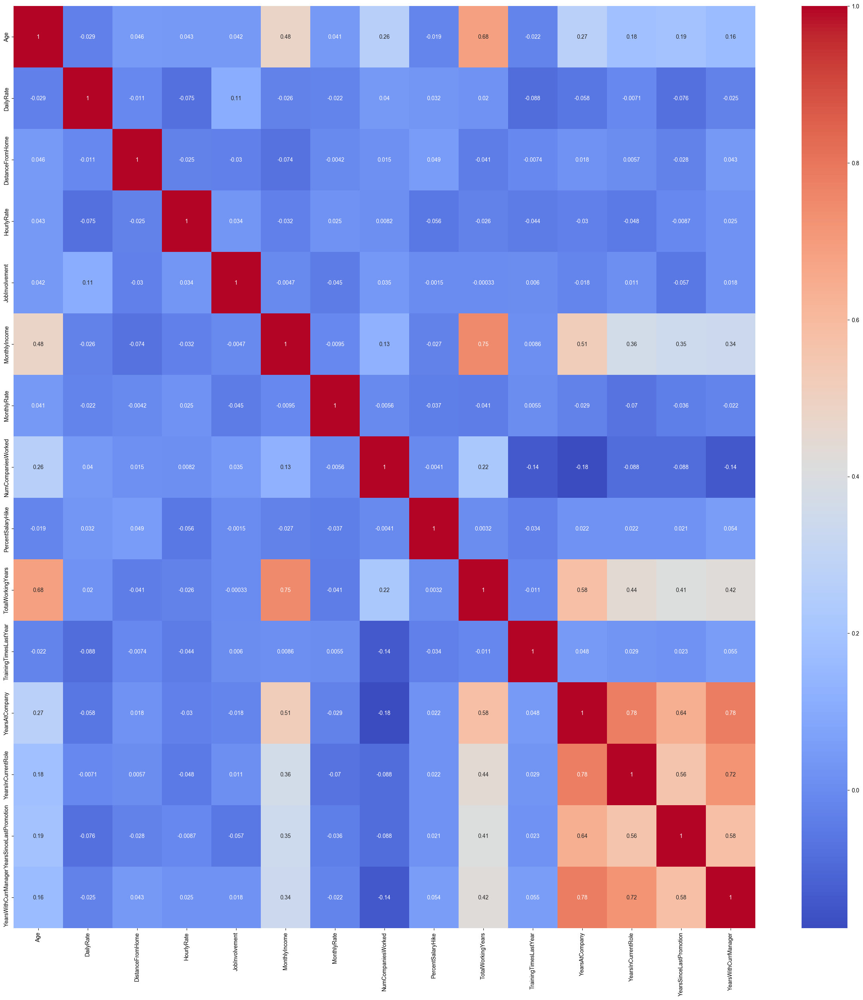

In [11]:
## 利用 皮尔逊相关系数 来衡量两个数值变量之间的线性关系
numeric_data = pd.DataFrame()

for feature in numerical_feature:
    numeric_data[feature] = data[feature]

corr_data = numeric_data.corr(method='pearson')

plt.figure(figsize=(30,30))
sns.heatmap(data= corr_data, cmap='coolwarm', annot=True, fmt='.2g')

<font size=5>假定相关系数大于等于 0.75 时具有比较强的相关性</font>

可见， 

    Monthlyincome 与 TotalWorkingYears —— 0.75

    YearsAtCompany 与 YearsinCurrentRole —— 0.78

    YearsAtCompany 与 YearsWithCurrManager —— 0.78

<font size=5>若目标是预测模型（如预测离职率）</font>

- 问题：高相关性可能导致多重共线性（Multicollinearity），影响模型稳定性和可解释性。

- 解决方案：

    - (1) 剔除其中一个变量
        - 根据业务意义选择保留更重要的变量：

        - 若关注 薪资对离职的影响，保留 MonthlyIncome；

        - 若关注 职业成长对离职的影响，保留 TotalWorkingYears。

        - 注意：需通过模型对比（如AIC/BIC值或交叉验证）验证剔除后的模型效果。

    - (2) 主成分分析（PCA）
    
        - 将高相关性的变量合并为新的主成分，降低维度并消除共线性。

        - 代价：牺牲变量可解释性，适合复杂模型（如神经网络）。

    - (3) 正则化（Lasso/Ridge Regression）

        - 在回归模型中添加正则化项（L1/L2惩罚），自动抑制冗余变量的权重。

        - 优势：无需手动剔除变量，适合特征数量较多的情况。

<font size=5>若目标是因果推断（Causal Inference）</font>

- 问题：需分离变量对结果的独立影响（例如薪资和工作年限各自对离职的贡献）。

- 解决方案：

    - (1) 分层分析（Stratification）

        - 将样本按 TotalWorkingYears 分组，在每组内分析 MonthlyIncome 对离职的影响，或反之。

    - (2) 残差法

        - 用 MonthlyIncome 对 TotalWorkingYears 回归，提取残差作为“与工作年限无关的薪资部分”，再将残差纳入模型。

    - (3) 工具变量（Instrumental Variable）
    
        - 引入与 MonthlyIncome 相关但与 TotalWorkingYears 无关的外部变量（如行业平均薪资），但需严格验证工具变量有效性

此处，计划利用 PCA 消除 Monthlyincome 与 TotalWorkingYears 之间的共线性

再构建新变量 ：

- YearsInCurrentRole / YearsAtCompany = JobStability
    
    - 衡量“职位稳定性”（比例越高，晋升/调岗越少）。

- YearsAtCompany - YearsWithCurrManager = LeaderTurnRate

    - 衡量“上级更换频率”。

### 消除共线性

In [12]:
# USING PCA TO ADDRESSING MULTICOLINEARITY
zscore = StandardScaler()

# NORMALIZATION
multi_cols = data[['MonthlyIncome','TotalWorkingYears']]   # COLUMN THAT HAS MULTICOLINEARITY
multi_cols = zscore.fit_transform(multi_cols)

# FIND PRINCIPAL COMPONENT OPTIMAL
pca  = PCA(n_components=None)
pca.fit_transform(multi_cols)


print(f'Number of Components : {pca.n_components_}')
print(f'Ratio every Component / PC : {pca.explained_variance_ratio_}\n')
print(f'PCA Components : \n{pca.components_}\n')
print('---------------------------------')

Number of Components : 2
Ratio every Component / PC : [0.87573485 0.12426515]

PCA Components : 
[[ 0.70710678  0.70710678]
 [-0.70710678  0.70710678]]

---------------------------------


PC 1 的解释率达到了 87% 

In [13]:
# CHOOSE PC1

pca_1  = PCA(n_components=1)
multi_cols_1 = pca_1.fit_transform(multi_cols)

# ADD PC1 TO DATAFRAME
data['multi_cols_1'] = multi_cols_1.ravel()

"""
    ravel()函数的作用是将多维数组​​展平为一维数组​​。
    multi_cols_1是通过PCA降维后得到的二维数组(形状为(n_samples, 1)),
    而ravel()将其转换为形状为(n_samples,)的一维数组,以便与DataFrame的列对齐
"""

'\n    ravel()函数的作用是将多维数组\u200b\u200b展平为一维数组\u200b\u200b。\n    multi_cols_1是通过PCA降维后得到的二维数组(形状为(n_samples, 1)),\n    而ravel()将其转换为形状为(n_samples,)的一维数组,以便与DataFrame的列对齐\n'

In [14]:
data['JobStability'] = data['YearsInCurrentRole'] / data['YearsAtCompany']
data['LeaderTurnRate'] = data['YearsAtCompany'] - data['YearsWithCurrManager'] 

### 检验共线性

<Axes: >

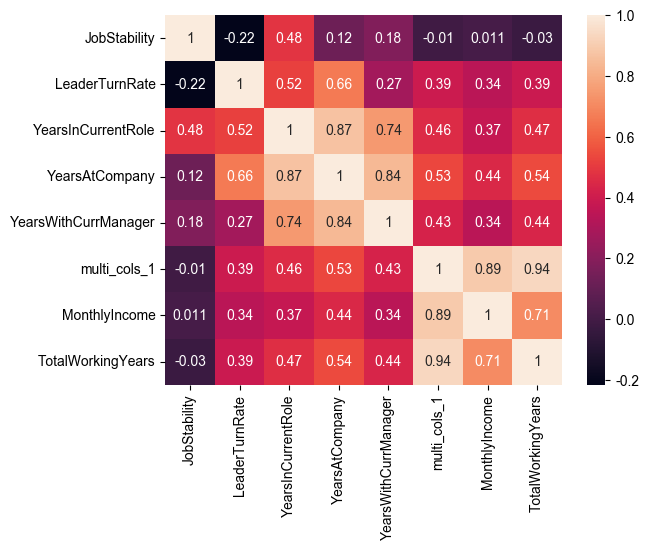

In [15]:
multi = data[['JobStability', 'LeaderTurnRate','YearsInCurrentRole','YearsAtCompany','YearsWithCurrManager',
             'multi_cols_1', 'MonthlyIncome','TotalWorkingYears' ]]
multiq = multi.corr(method='spearman')

sns.heatmap(data=multiq, annot=True, fmt='.2g')

显然，共线性已经被消除，接下来让我们丢掉多余的列

In [16]:
multi_corr = ['YearsInCurrentRole','YearsAtCompany','YearsWithCurrManager','MonthlyIncome','TotalWorkingYears']

data.drop(labels= multi_corr, axis=1, inplace=True )

data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TrainingTimesLastYear,WorkLifeBalance,YearsSinceLastPromotion,multi_cols_1,JobStability,LeaderTurnRate
0,28.0,0,1.0,1217.0,1.0,1.0,3.0,4.0,3.0,0.0,...,25.0,4.0,3.0,1.0,3.0,3.0,1.0,-1.255586,0.666667,1.0
1,29.0,0,1.0,1010.0,1.0,1.0,3.0,3.0,1.0,0.0,...,15.0,3.0,1.0,3.0,5.0,3.0,1.0,-1.230857,0.666667,1.0
2,25.0,0,2.0,772.0,1.0,2.0,1.0,3.0,4.0,1.0,...,17.0,3.0,3.0,2.0,6.0,3.0,0.0,-0.663412,1.000000,0.0
3,47.0,0,2.0,1379.0,1.0,16.0,4.0,4.0,3.0,1.0,...,19.0,3.0,3.0,0.0,3.0,4.0,2.0,0.472771,0.526316,12.0
4,27.0,0,1.0,1103.0,1.0,14.0,3.0,3.0,1.0,1.0,...,14.0,3.0,4.0,2.0,3.0,2.0,6.0,-0.920229,0.777778,1.0


## 有序变量间的相关性

分类变量又可以分成名义变量和有序变量两类

In [17]:
categorical_feature

['Attrition',
 'BusinessTravel',
 'Department',
 'JobRole',
 'JobLevel',
 'Education',
 'EducationField',
 'Gender',
 'MaritalStatus',
 'EnvironmentSatisfaction',
 'JobSatisfaction',
 'RelationshipSatisfaction',
 'WorkLifeBalance',
 'PerformanceRating',
 'OverTime',
 'StockOptionLevel']

In [18]:
nominal_feature = ['Attrition','Department','JobRole','EducationField','Gender','MaritalStatus','OverTime']
ordinal_feature = ['BusinessTravel','JobLevel','Education','EnvironmentSatisfaction','JobSatisfaction','RelationshipSatisfaction',
                   'WorkLifeBalance','PerformanceRating','StockOptionLevel']

对于有序变量，采用 Spearman 秩相关分析

<Axes: >

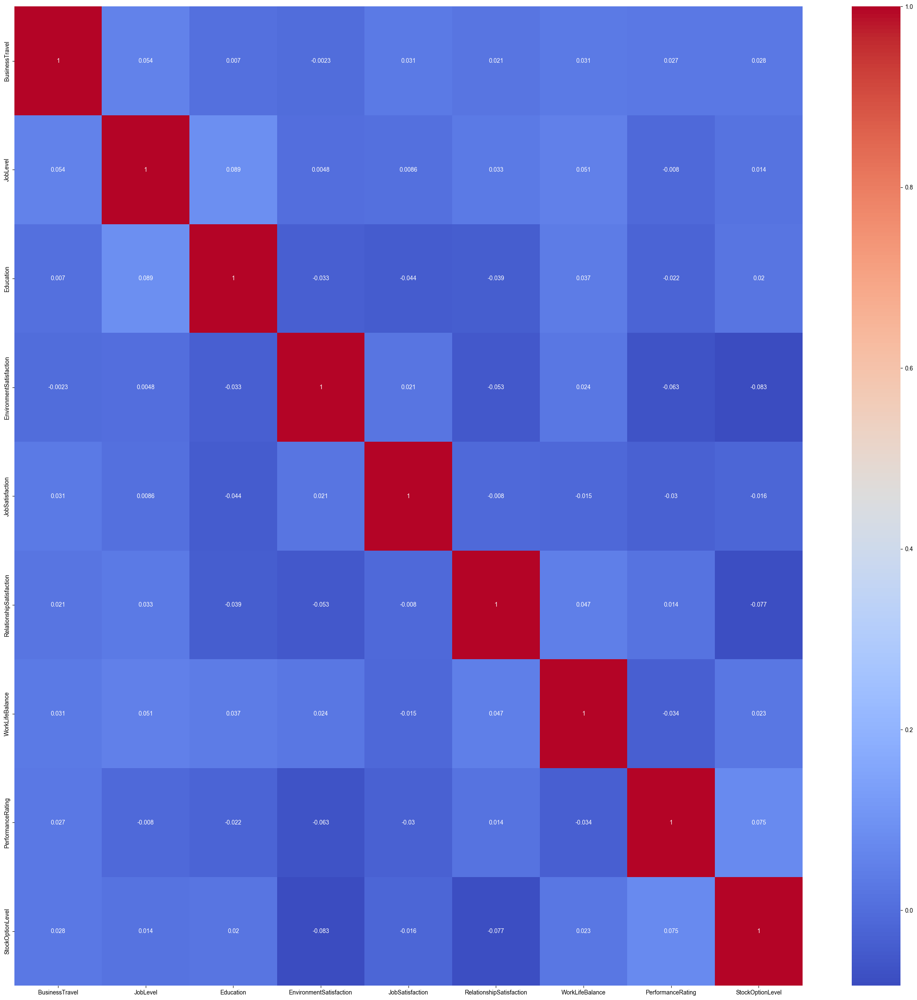

In [19]:
spearman_corr = data[ordinal_feature].corr(method='spearman')

plt.figure(figsize=(30,30))
sns.heatmap(data= spearman_corr, cmap='coolwarm', annot=True, fmt='.2g')

可见， 有序变量之间的相关性都比较低

# 关联性分析

## 名义变量

<font size=5>卡方检验与 Cramer’s V</font>

Cramer’s V 是基于卡方统计量得出的一个衡量两个分类变量之间关联程度的指标，它将卡方统计量标准化，使得该指标取值范围为 0 到 1。

- 取值解释：
    - 0 表示两个变量完全独立（无关联性）；
    - 1 表示两个变量之间存在完全关联。
- 无方向性：不同于一些相关系数，它不区分正向或负向关系，而是单纯衡量关联强度。


In [20]:
def cramers_v(confusion_matrix):
    """
    计算 Cramer’s V 值。confusion_matrix 为列联表，
    返回的 V 值范围 [0, 1]，数值越大表示两个变量之间的关联程度越高。
    """
    # 卡方统计量、p 值、自由度和期望频数
    chi2, _, _, _ = chi2_contingency(confusion_matrix)
    n = confusion_matrix.to_numpy().sum()  # 样本总数
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    # 避免除零错误，取较小的自由度
    denom = min(k - 1, r - 1)
    if denom == 0:
        return np.nan
    return np.sqrt(phi2 / denom)

In [21]:
# 创建一个空的 DataFrame 用来存储 Cramer’s V 值矩阵（对称矩阵）
n = len(nominal_feature)
cramers_v_matrix = pd.DataFrame(np.zeros((n, n)), index=nominal_feature, columns=nominal_feature)

# 两两计算名义变量间的 Cramer’s V
for i in range(n):
    for j in range(i, n):
        if i == j:
            # 同一变量的相关性为 1
            cramers_v_matrix.iloc[i, j] = 1.0
        else:
            feat1 = nominal_feature[i]
            feat2 = nominal_feature[j]
            # 构造列联表
            contingency_table = pd.crosstab(data[feat1], data[feat2])
            # 计算 Cramer’s V
            cv = cramers_v(contingency_table)
            cramers_v_matrix.iloc[i, j] = cv
            cramers_v_matrix.iloc[j, i] = cv  # 填充对称位置

<Axes: >

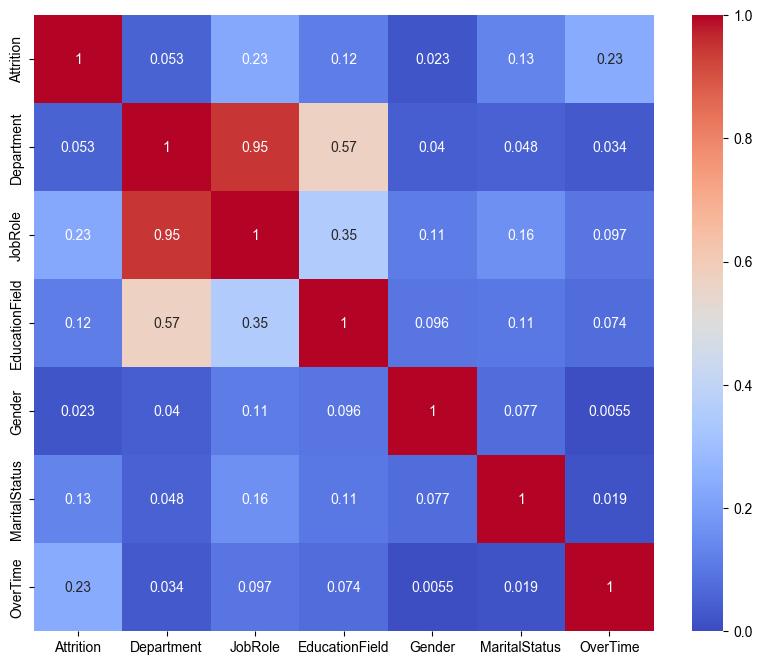

In [22]:
plt.figure(figsize=(10, 8))
sns.heatmap(cramers_v_matrix, annot=True, cmap='coolwarm', vmin=0, vmax=1)

由此可以看出，所属部门 Department 与具体职位 JobRole 具有很强的关联性

此时，直接考虑去掉 JobRole 特征

In [23]:
data.drop(axis=1, labels='JobRole', inplace=True)
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TrainingTimesLastYear,WorkLifeBalance,YearsSinceLastPromotion,multi_cols_1,JobStability,LeaderTurnRate
0,28.0,0,1.0,1217.0,1.0,1.0,3.0,4.0,3.0,0.0,...,25.0,4.0,3.0,1.0,3.0,3.0,1.0,-1.255586,0.666667,1.0
1,29.0,0,1.0,1010.0,1.0,1.0,3.0,3.0,1.0,0.0,...,15.0,3.0,1.0,3.0,5.0,3.0,1.0,-1.230857,0.666667,1.0
2,25.0,0,2.0,772.0,1.0,2.0,1.0,3.0,4.0,1.0,...,17.0,3.0,3.0,2.0,6.0,3.0,0.0,-0.663412,1.000000,0.0
3,47.0,0,2.0,1379.0,1.0,16.0,4.0,4.0,3.0,1.0,...,19.0,3.0,3.0,0.0,3.0,4.0,2.0,0.472771,0.526316,12.0
4,27.0,0,1.0,1103.0,1.0,14.0,3.0,3.0,1.0,1.0,...,14.0,3.0,4.0,2.0,3.0,2.0,6.0,-0.920229,0.777778,1.0


# EDA

## 数据集信息

In [24]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 441 entries, 0 to 440
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       441 non-null    float64
 1   Attrition                 441 non-null    int64  
 2   BusinessTravel            441 non-null    float64
 3   DailyRate                 441 non-null    float64
 4   Department                441 non-null    float64
 5   DistanceFromHome          441 non-null    float64
 6   Education                 441 non-null    float64
 7   EducationField            441 non-null    float64
 8   EnvironmentSatisfaction   441 non-null    float64
 9   Gender                    441 non-null    float64
 10  HourlyRate                441 non-null    float64
 11  JobInvolvement            441 non-null    float64
 12  JobLevel                  441 non-null    float64
 13  JobSatisfaction           441 non-null    float64
 14  MaritalSta

## 空值

In [25]:
data.isna().sum()

Age                          0
Attrition                    0
BusinessTravel               0
DailyRate                    0
Department                   0
DistanceFromHome             0
Education                    0
EducationField               0
EnvironmentSatisfaction      0
Gender                       0
HourlyRate                   0
JobInvolvement               0
JobLevel                     0
JobSatisfaction              0
MaritalStatus                0
MonthlyRate                  0
NumCompaniesWorked           0
OverTime                     0
PercentSalaryHike            0
PerformanceRating            0
RelationshipSatisfaction     0
StockOptionLevel             0
TrainingTimesLastYear        0
WorkLifeBalance              0
YearsSinceLastPromotion      0
multi_cols_1                 0
JobStability                11
LeaderTurnRate               0
dtype: int64

此处经检查发现构建的新特征 JobStability 存在空值，可能是因计算时分母 YearsAtCompany 为0导致

不妨将空值填充为0，在职未满一年可认为稳定性较差

In [26]:
data['JobStability']

0      0.666667
1      0.666667
2      1.000000
3      0.526316
4      0.777778
         ...   
436    0.000000
437    0.833333
438    1.000000
439    0.700000
440    0.600000
Name: JobStability, Length: 441, dtype: float64

In [27]:
data['JobStability'].fillna(value=0,inplace=True)
data.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobSatisfaction             0
MaritalStatus               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsSinceLastPromotion     0
multi_cols_1                0
JobStability                0
LeaderTurnRate              0
dtype: int64

## 数据分布

### 分类变量

In [28]:
# 去掉已经删除的变量
categorical_cols = list(
    set(categorical_feature) - set(['JobRole'])
)
len(categorical_cols)

15

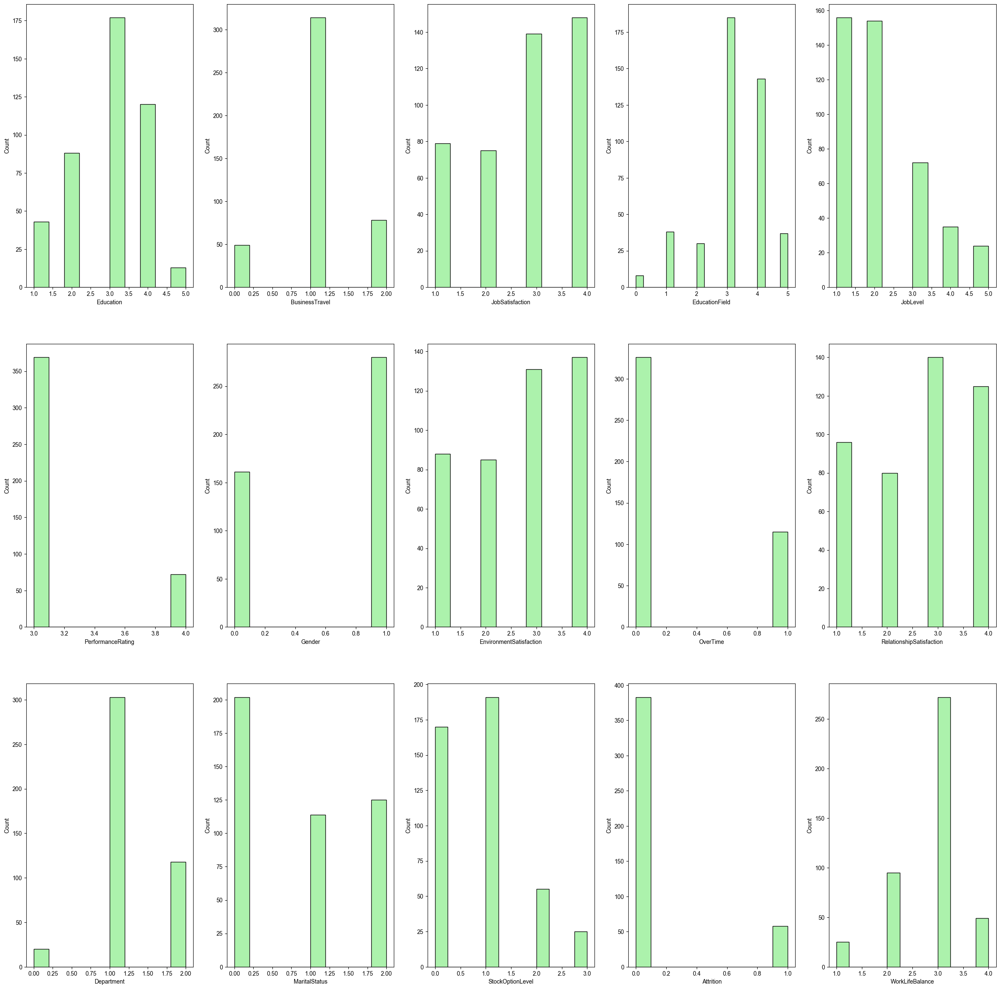

In [29]:
fig , axes = plt.subplots(nrows= 3, ncols=5, figsize=(30,30))

for i, feature in enumerate(categorical_cols):
    sns.histplot(data= data, x=feature, ax=axes[i%3, i//3], color='lightgreen')  

不存在某些列几乎由一种取值主导，可认为分类变量数据分布正常

### 数值变量

In [30]:
numerical_cols = [col for col in data.columns if col not in categorical_cols]
len(numerical_cols)

13

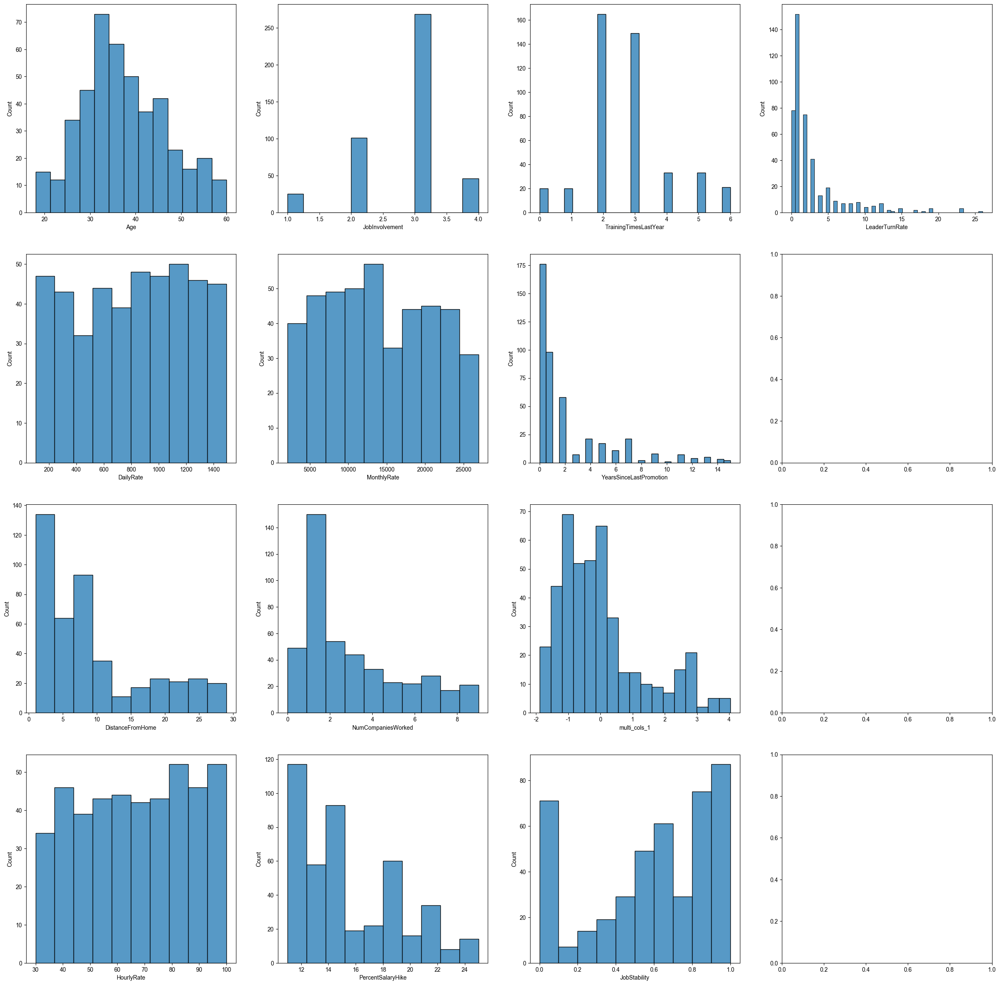

In [31]:
fig , axes = plt.subplots(nrows= 4, ncols=4, figsize=(30,30))

for i, feature in enumerate(numerical_cols):
    sns.histplot(data= data, x=feature, ax=axes[i%4, i//4])  

数值变量中包含着离散变量与连续变量

由柱形图可见，离散变量中并不存在由某一数值主导的情况

但是连续变量的分布呈现为偏态分布与均匀分布两种类型

数据的分布（无论是偏态还是均匀分布）确实会对分箱过程产生一定的影响，但 scorecardpy 包内的自动分箱函数设计时已考虑了这些情况，通过自适应确定箱数、单调性检验和参数调控等方法来尽可能获得稳定且具有识别能力的分箱结果。

在使用自动分箱后，对分箱结果进行充分的检验和适当的参数调整，确保分箱在后续评分卡模型中的实际有效性。

# 评分卡模型

## 筛选变量

In [32]:
# 筛选变量（过滤缺失率、IV值以及单一值过高的变量）
data_filtered = sc.var_filter(data, y="Attrition")
data_filtered

[INFO] filtering variables ...


,PercentSalaryHike,Education,Age,JobInvolvement,Department,PerformanceRating,BusinessTravel,JobSatisfaction,MaritalStatus,HourlyRate,...,DailyRate,DistanceFromHome,JobLevel,NumCompaniesWorked,YearsSinceLastPromotion,RelationshipSatisfaction,LeaderTurnRate,WorkLifeBalance,TrainingTimesLastYear,Attrition
0,25.0,3.0,28.0,3.0,1.0,4.0,1.0,1.0,0.0,67.0,...,1217.0,1.0,1.0,1.0,1.0,3.0,1.0,3.0,3.0,0
1,15.0,3.0,29.0,3.0,1.0,3.0,1.0,4.0,1.0,97.0,...,1010.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,5.0,0
2,17.0,1.0,25.0,4.0,1.0,3.0,2.0,3.0,1.0,77.0,...,772.0,2.0,2.0,1.0,0.0,3.0,0.0,3.0,6.0,0
3,19.0,4.0,47.0,4.0,1.0,3.0,2.0,3.0,1.0,64.0,...,1379.0,16.0,2.0,1.0,2.0,3.0,12.0,4.0,3.0,0
4,14.0,3.0,27.0,3.0,1.0,3.0,1.0,1.0,0.0,42.0,...,1103.0,14.0,1.0,1.0,6.0,4.0,1.0,2.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
436,20.0,3.0,30.0,3.0,1.0,4.0,2.0,3.0,1.0,71.0,...,160.0,3.0,1.0,1.0,0.0,3.0,1.0,3.0,2.0,0
437,23.0,1.0,25.0,3.0,2.0,4.0,1.0,4.0,2.0,32.0,...,883.0,26.0,2.0,1.0,1.0,2.0,2.0,2.0,5.0,0
438,13.0,4.0,28.0,3.0,1.0,3.0,1.0,3.0,2.0,50.0,...,1434.0,5.0,1.0,1.0,2.0,3.0,0.0,2.0,3.0,1
439,14.0,3.0,35.0,3.0,2.0,3.0,2.0,3.0,2.0,92.0,...,944.0,1.0,3.0,1.0,0.0,1.0,2.0,4.0,3.0,0


## 分箱

WOE（Weight of Evidence，证据权重）是一种在统计建模中常用的变量转换技术。

它的核心思想是利用每个变量分箱中的“好样本”和“坏样本”比例来衡量该分箱对预测目标（如违约、离职等）的信息贡献。

<font size=5>WOE 的特点与优势</font>

- 稳定性和线性关系
    - 在许多情况下，将原始变量转换为 WOE 值后，与目标变量（特别是在逻辑回归模型中的对数几率）呈现出更明显的线性关系，这有助于提高模型的稳定性和可解释性。
- 降噪和处理缺失值
    - 分箱过程本身可以降低数据的噪声。对于缺失值，可以将其单独归为一个箱，计算对应的 WOE 值，从而使缺失信息有一个合理的表示。
- 易于解释
    - WOE 值直接反映某个分箱内“非事件”和“事件”样本的比例关系。正值通常意味着该分箱中非事件比例相对较高（风险较低），负值则意味着事件比例较高（风险较高）。这种解释对于决策制定具有直观意义。
- 与 IV（信息值）联用
    - WOE 分箱的另一个重要应用是计算信息值（IV），用来衡量变量对目标变量预测能力的强弱。一般来说，IV 值越大，变量对目标变量的区分能力越强。

<font size=5>分箱控制参数​</font>​

- ​​var_skip​​：跳过分箱的变量名列表（直接保留原始值，常用于已处理好的变量）。
​
- ​breaks_list​​：自定义分箱切点字典（例如 {'age': [26, 35, 40]}），用于手动调整分箱区间。

- ​​special_values​​：指定某些值单独分箱（如将 "none" 单独设为一箱）。

- ​​method​​：分箱方法，可选 "tree"（决策树分箱，默认）或 "chimerge"（卡方分箱）。
​​
- bin_num_limit​​：最大分箱数（默认8），防止分箱过多导致过拟合。
​​
- stop_limit​​：分箱停止条件（默认0.1），当IV增长率或卡方值低于此阈值时停止分箱。
​​
- count_distr_limit​​：分箱最小样本占比（默认0.05），低于此值的箱体会被合并

ChiMerge 方法适用于需要对连续变量进行离散化且目标变量为分类变量的数据集，特别是在类别频率相对稳定的情况下效果更佳

对 'DailyRate', 'HourlyRate', 'MonthlyRate' 采用 chimerge 分箱

In [34]:
# 使用 scorecardpy 进行分箱（Binning）
# woebin 会自动对指定变量进行分箱，并利用目标变量 Attrition 寻找最佳切分点

# ['MonthlyRate'] not in index 被筛掉了
chi_cols = ['DailyRate', 'HourlyRate']
bins_chimerge = sc.woebin(data_filtered, y="Attrition", x=chi_cols, method='chimerge')

[INFO] creating woe binning ...


/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/woebin.py:320: FutureWarning: The default of observed=Fals

In [35]:
other_cols = list(set(data_filtered.columns) -set(['Attrition'])- set(chi_cols))
bins_default = sc.woebin(data_filtered, y="Attrition", x=other_cols)

[INFO] creating woe binning ...


/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/woebin.py:320: FutureWarning: The default of observed=Fals

In [36]:
# 合并所有的分箱结果，key 为变量名称
bins = {**bins_default, **bins_chimerge}


In [37]:
def plot_bin(binx, title=None, show_iv=True):
    """
    优化后的分箱可视化函数，支持：
      1. 在标题中或副标题中显示对应的特征名称
      2. 在 x 轴上正确显示分箱区间

    Parameters
    ----------
    binx : DataFrame
        单变量的分箱信息，通常包含下列列：['variable', 'bin', 'count', 'good', 'bad', 'badprob', 'woe', 'total_iv'] 等
    title : str or None
        图形主标题中要追加的文本
    show_iv : bool
        是否在图形标题中显示 IV 值

    Returns
    -------
    matplotlib.figure.Figure
        返回包含该单变量分箱可视化的 Figure 对象
    """

    # ============= 2. 准备数据 =============
    # 提取变量名称（若无 'variable' 列，则设置为 None）
    var_name = binx['variable'].iloc[0] if 'variable' in binx.columns else None

    # 转成字符串，避免 matplotlib 在处理负号、逗号等字符时出现乱码或不识别
    bin_labels = binx['bin'].astype(str)

    # ============= 3. 创建图表 =============
    fig, ax1 = plt.subplots(figsize=(6, 4), dpi=300)

    # 左 y 轴：绘制样本数的柱状图
    ax1.bar(bin_labels, binx['count'], color='skyblue', label='样本数')
    ax1.set_ylabel('样本数', color='blue', fontsize=12)
    ax1.tick_params(axis='y', labelcolor='blue')

    # 右 y 轴：绘制坏样本占比的折线图
    ax2 = ax1.twinx()
    ax2.plot(bin_labels, binx['bad_distr'], color='red', marker='o', label='坏样本占比')
    ax2.set_ylabel('坏样本占比', color='red', fontsize=12)
    ax2.tick_params(axis='y', labelcolor='red')

    # ============= 4. 设置图形标题 =============
    # 构建主标题：包括“特征名称”和“可选标题”以及 IV 值等信息
    iv_text = ""
    if show_iv and "total_iv" in binx.columns:
        iv_text = f" - IV: {binx['total_iv'].iloc[0]:.4f}"

    # 如果有 var_name，则展示在标题中
    if var_name:
        main_title = f"特征：{var_name} 分箱结果"
    else:
        main_title = "WOE 分箱结果"

    # 若还要加自定义 title，可附加在末尾
    if title is not None:
        main_title += f" - {title}"

    full_title = main_title + iv_text
    ax1.set_title(full_title, fontsize=13)

    # x 轴命名（可根据需要修改文字）
    ax1.set_xlabel('分箱区间', fontsize=12)

    # ============= 5. 调整布局 =============
    fig.tight_layout()

    return fig


In [38]:
def woebin_plot_fixed(bins, x=None, title=None, show_iv=True):
    """
    自定义 WOE 分箱结果可视化函数

    Parameters
    ----------
    bins : dict 或 DataFrame
        由 woebin 生成的分箱信息。若为 dict 类型，将进行 concat 转换为 DataFrame。
    x : list or None, default None
        指定需要绘制的变量名称列表。若为 None，则对所有变量进行绘图。
    title : str or None, default None
        添加在图标题上的字符串，默认 None。
    show_iv : bool, default True
        是否在图标题中显示 IV 值，默认 True。

    Returns
    -------
    dict
        一个字典，每个 key 对应一个变量的 matplotlib 图形对象。

    示例
    -------
    >>> import scorecardpy as sc
    >>> import matplotlib.pyplot as plt
    >>> dat = sc.germancredit()
    >>> bins = sc.woebin(dat, y="creditability")
    >>> plotlist = woebin_plot_fixed(bins)
    >>> for key, fig in plotlist.items():
    ...     plt.show(fig)
    """
    # 如果 bins 是 dict，则先合并成 DataFrame
    if isinstance(bins, dict):
        bins = pd.concat(bins, ignore_index=True)
    
    # 确保 'variable' 列中所有值均为可哈希的类型（如 str）
    if 'variable' in bins.columns:
        bins['variable'] = bins['variable'].apply(lambda x: x if isinstance(x, str) else str(x))
    else:
        raise ValueError("传入的分箱数据中缺少 'variable' 列！")
    
    # 针对每个变量，计算好样本与坏样本的分布
    def gb_distr(binx):
        binx = binx.copy()
        binx['good_distr'] = binx['good'] / binx['count'].sum()
        binx['bad_distr'] = binx['bad'] / binx['count'].sum()
        return binx

    # 按变量分组时可以避免因不可哈希的数据类型出错
    bins = bins.groupby('variable', group_keys=False).apply(gb_distr)
    
    # 确定需要绘图的变量列表
    xs = x if x is not None else bins['variable'].unique()

    # 存放各变量绘图结果
    plotlist = {}
    for var in xs:
        binx = bins[bins['variable'] == var].reset_index(drop=True)
        # 调用 plot_bin 生成单变量分箱图，这里假设 plot_bin 接受 (bin数据, title, show_iv) 参数
        # 你可以根据实际情况自行定义 plot_bin，下面提供一种简单实现范例
        plotlist[var] = plot_bin(binx, title, show_iv)
        
    return plotlist

/var/folders/y2/wt3c181576xcp7vkwx_d9h1h0000gn/T/ipykernel_22638/2874173766.py:49: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  bins = bins.groupby('variable', group_keys=False).apply(gb_distr)
/var/folders/y2/wt3c181576xcp7vkwx_d9h1h0000gn/T/ipykernel_22638/4095525721.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax1 = plt.subplots(figsize=(6, 4), dpi=300)
/var/folders/y2/wt3c181576xcp7vkwx_d9h1h0000gn/T/ipykernel_2263

{'PercentSalaryHike': <Figure size 1800x1200 with 2 Axes>,
 'Education': <Figure size 1800x1200 with 2 Axes>,
 'Age': <Figure size 1800x1200 with 2 Axes>,
 'JobInvolvement': <Figure size 1800x1200 with 2 Axes>,
 'Department': <Figure size 1800x1200 with 2 Axes>,
 'PerformanceRating': <Figure size 1800x1200 with 2 Axes>,
 'BusinessTravel': <Figure size 1800x1200 with 2 Axes>,
 'JobSatisfaction': <Figure size 1800x1200 with 2 Axes>,
 'MaritalStatus': <Figure size 1800x1200 with 2 Axes>,
 'EnvironmentSatisfaction': <Figure size 1800x1200 with 2 Axes>,
 'JobStability': <Figure size 1800x1200 with 2 Axes>,
 'StockOptionLevel': <Figure size 1800x1200 with 2 Axes>,
 'EducationField': <Figure size 1800x1200 with 2 Axes>,
 'OverTime': <Figure size 1800x1200 with 2 Axes>,
 'DistanceFromHome': <Figure size 1800x1200 with 2 Axes>,
 'JobLevel': <Figure size 1800x1200 with 2 Axes>,
 'NumCompaniesWorked': <Figure size 1800x1200 with 2 Axes>,
 'YearsSinceLastPromotion': <Figure size 1800x1200 with 2 A

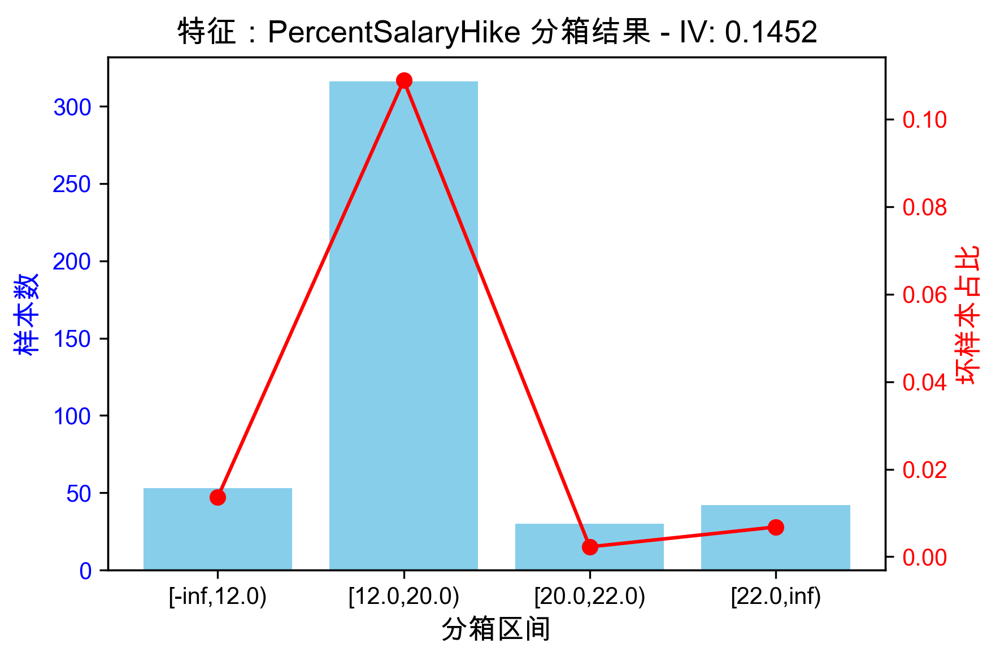

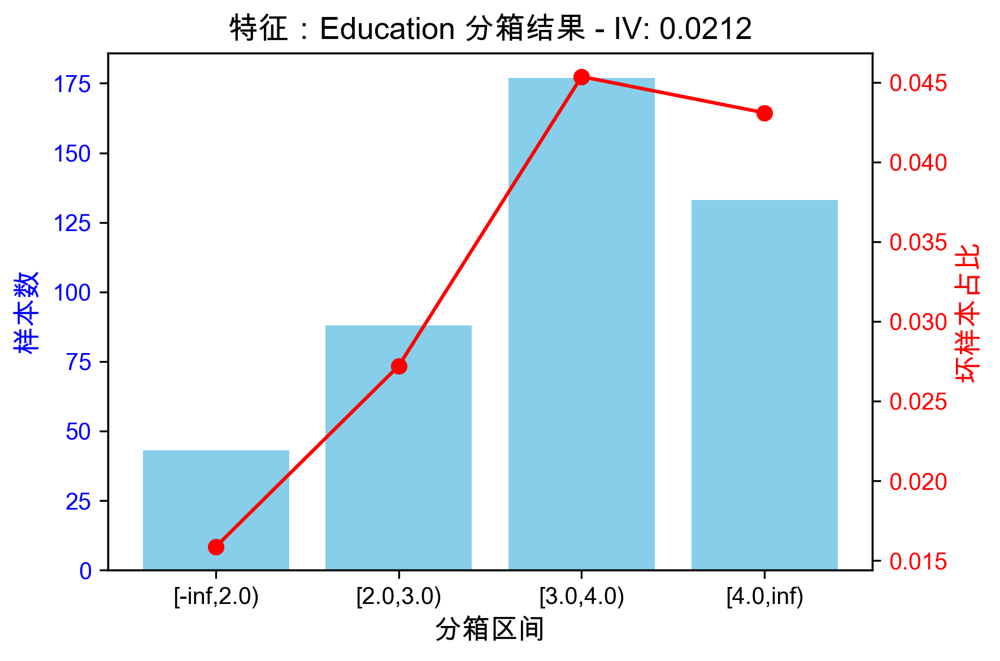

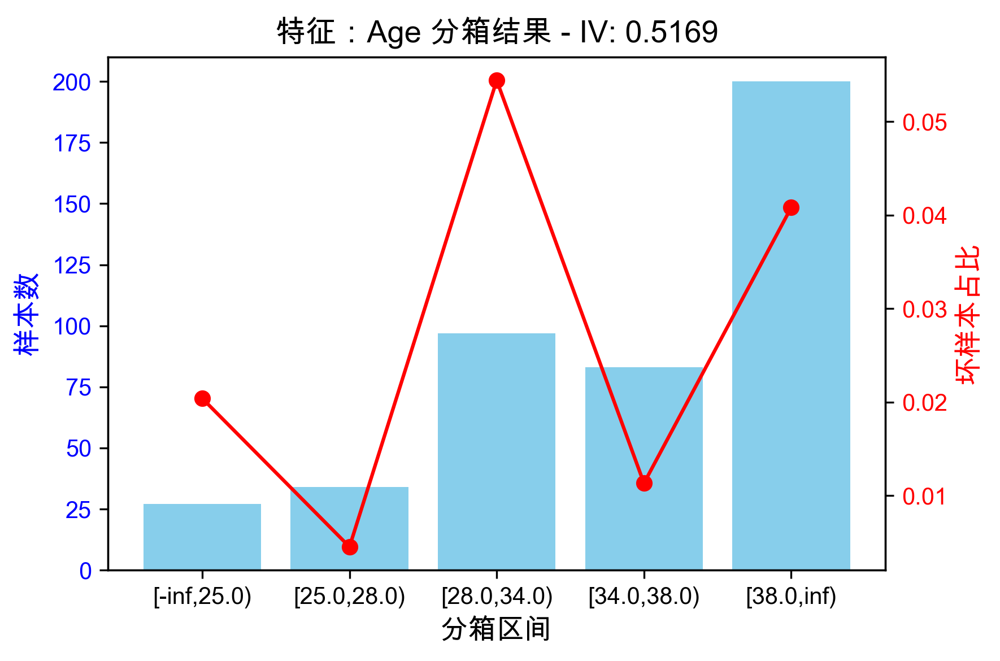

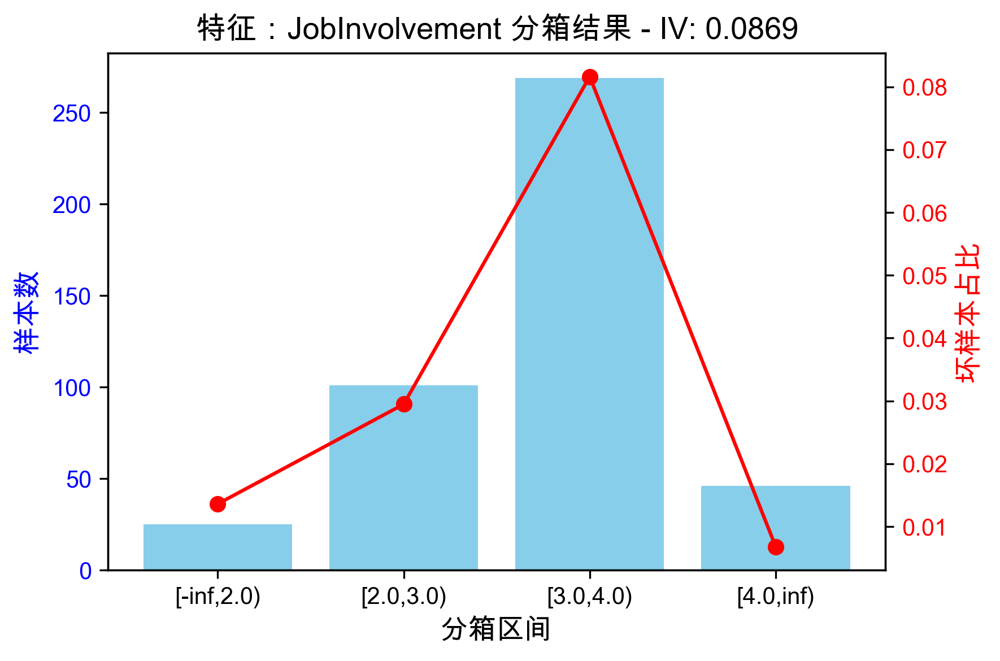

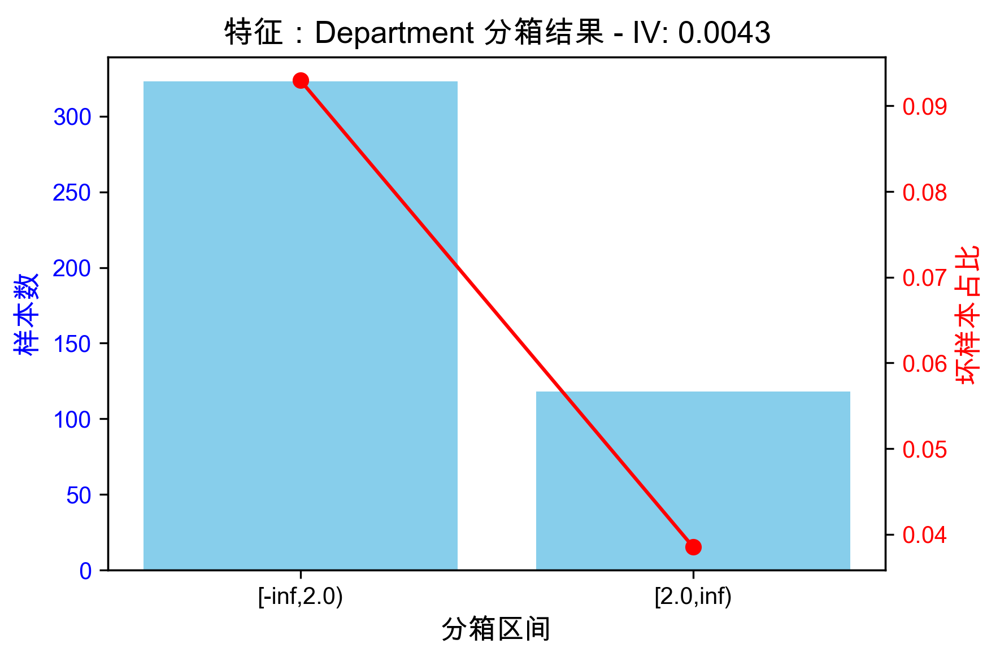

...

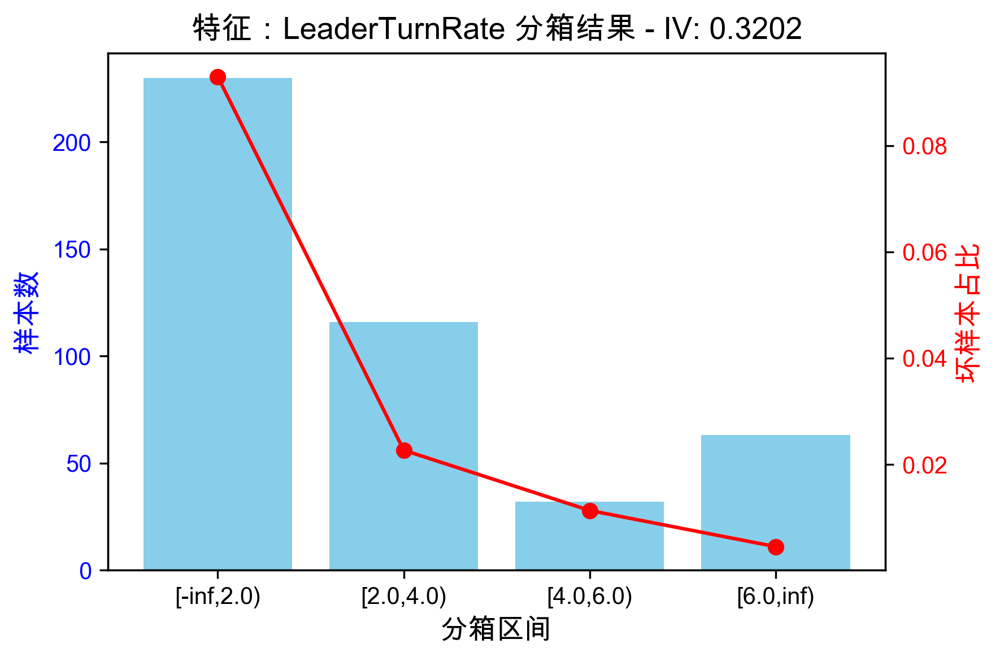

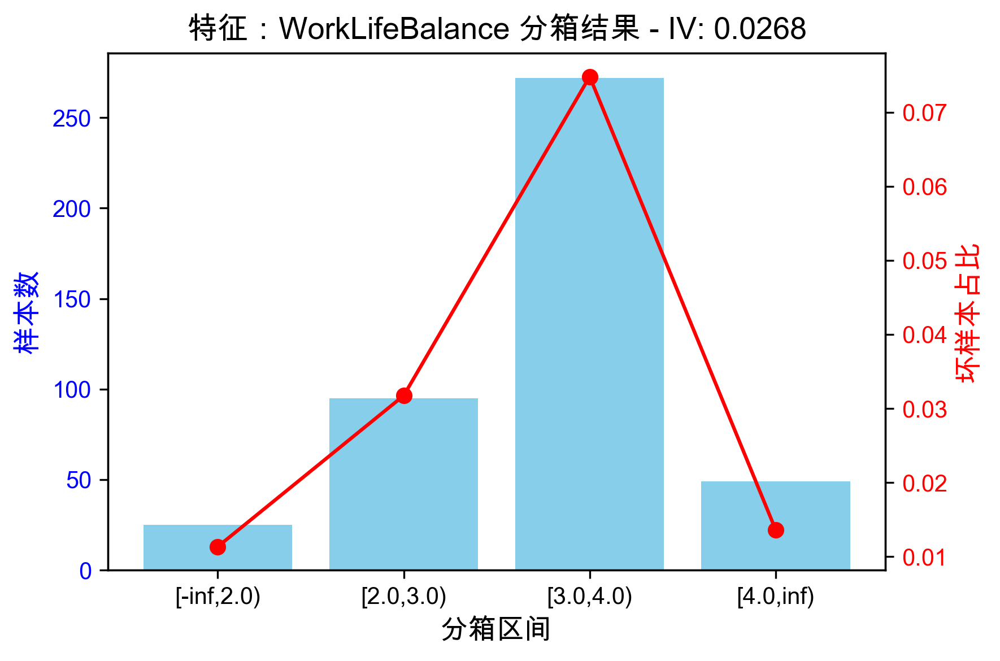

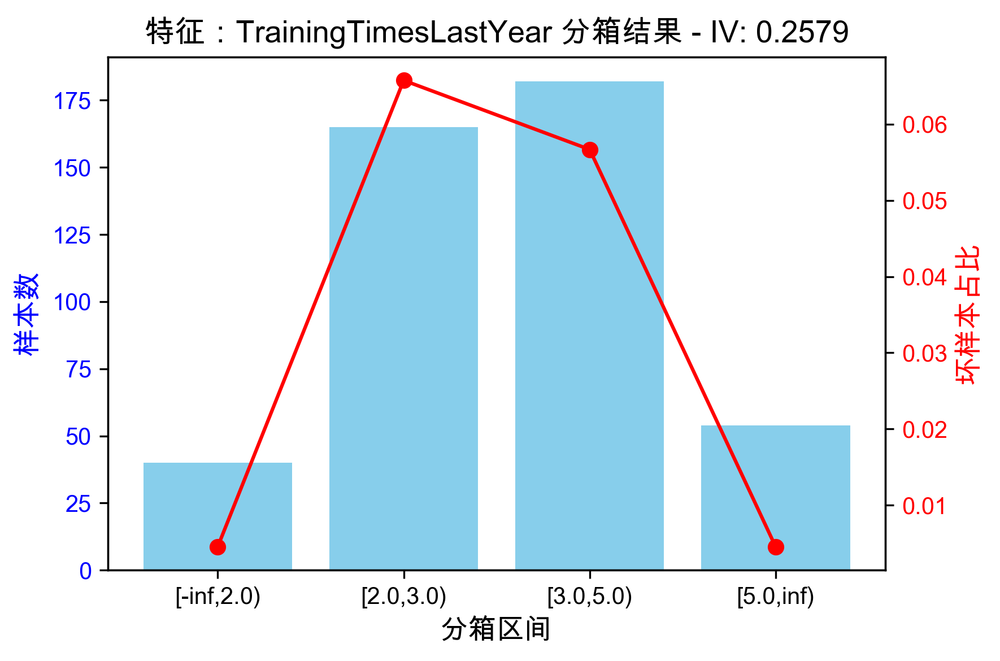

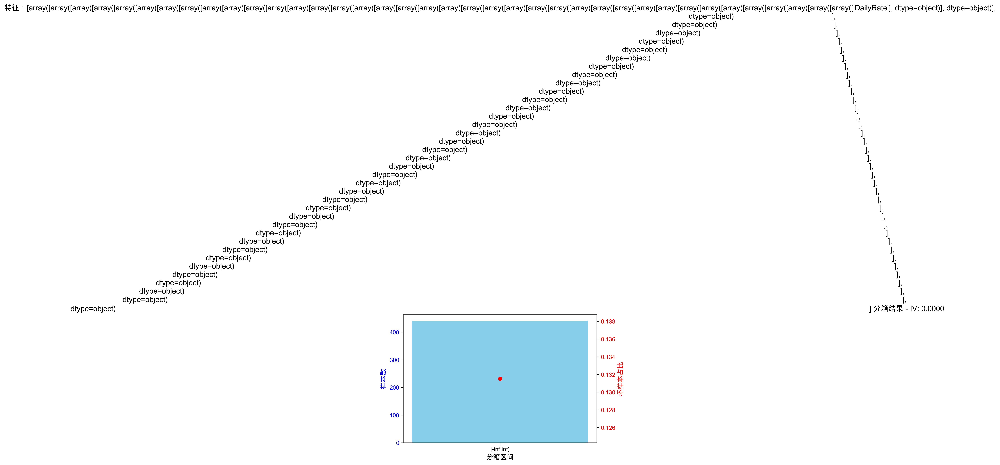

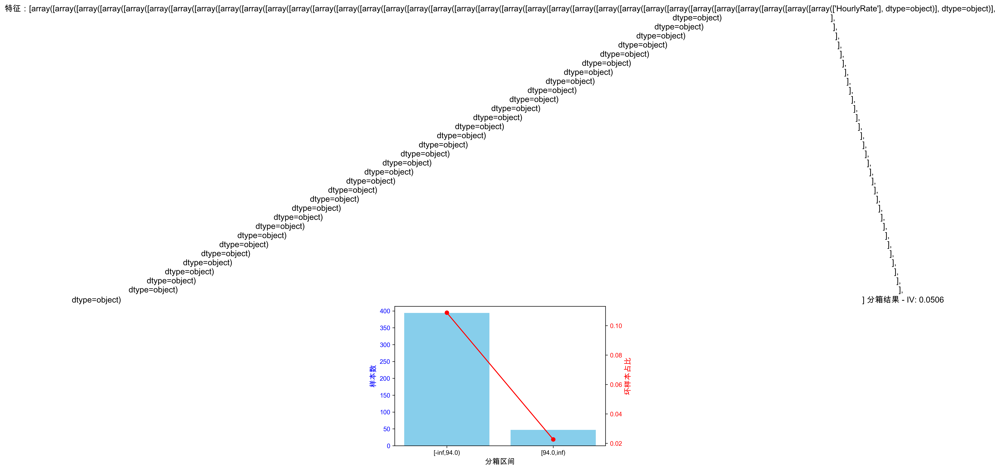

In [39]:
woebin_plot_fixed(bins)

经初步的分箱，考虑删除 iv 值较大或较小的特征，并对坏样本占比呈现非单调性的特征进行重新分箱

In [40]:
data_filtered.columns

Index(['PercentSalaryHike', 'Education', 'Age', 'JobInvolvement', 'Department',
       'PerformanceRating', 'BusinessTravel', 'JobSatisfaction',
       'MaritalStatus', 'HourlyRate', 'EnvironmentSatisfaction',
       'JobStability', 'StockOptionLevel', 'EducationField', 'OverTime',
       'DailyRate', 'DistanceFromHome', 'JobLevel', 'NumCompaniesWorked',
       'YearsSinceLastPromotion', 'RelationshipSatisfaction', 'LeaderTurnRate',
       'WorkLifeBalance', 'TrainingTimesLastYear', 'Attrition'],
      dtype='object')

删除特征：

    ['Department','JobInvolvement','BusinessTravel','Education','Age','EducationField','WorkLifeBalance','DailyRate','HourlyRate']

In [41]:
cols_drop =  ['Department','JobInvolvement','BusinessTravel','Education','Age','EducationField','WorkLifeBalance','DailyRate','HourlyRate']
data_drop = data_filtered.drop(labels=cols_drop, axis=1)

In [42]:
bins_drop = sc.woebin(data_drop, y="Attrition")

[INFO] creating woe binning ...


/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()


/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/woebin.py:320: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  init_bin = dtm.groupby('bin', group_keys=False)['y'].agg([n0, n1])\
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/woebin.py:320: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  init_bin = dtm.groupby('bin', group_keys=False)['y'].agg([n0, n1])\
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/woebin.py:320: FutureWarning: The default of observed=False is deprecated and will be changed to True in a fu

-------- 1/13 DistanceFromHome --------
>>> dt[DistanceFromHome].describe(): 
count    441.000000
mean       9.365079
std        8.078341
min        1.000000
25%        3.000000
50%        7.000000
75%       14.000000
max       29.000000
Name: DistanceFromHome, dtype: float64 



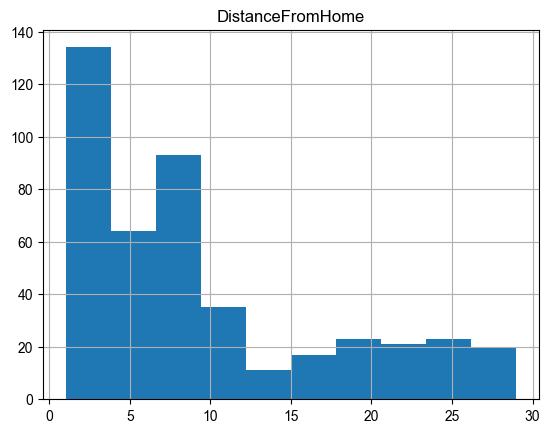

>>> Current breaks:
2.0,7.0,8.0,9.0,10.0,11.0,19.0 



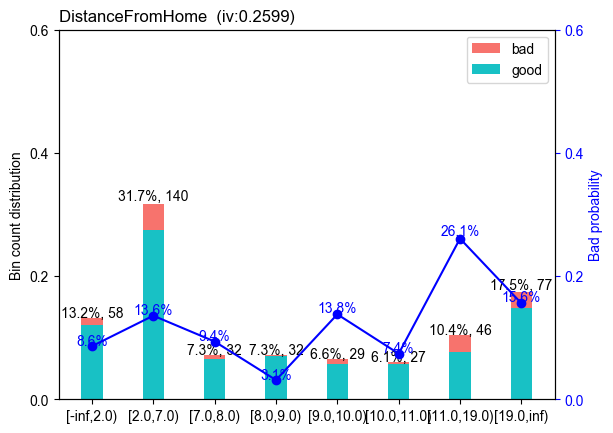

>>> Adjust breaks for (1/13) DistanceFromHome?
1: next 
2: yes 
3: back
[INFO] creating woe binning ...
>>> Current breaks:
2.0 



/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()


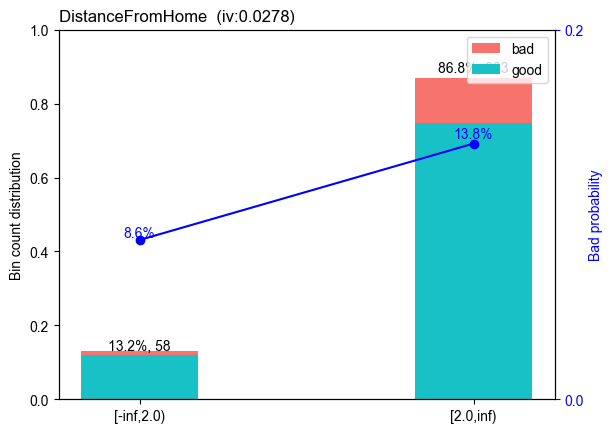

>>> Adjust breaks for (1/13) DistanceFromHome?
1: next 
2: yes 
3: back
-------- 1/13 DistanceFromHome --------
>>> dt[DistanceFromHome].describe(): 
count    441.000000
mean       9.365079
std        8.078341
min        1.000000
25%        3.000000
50%        7.000000
75%       14.000000
max       29.000000
Name: DistanceFromHome, dtype: float64 



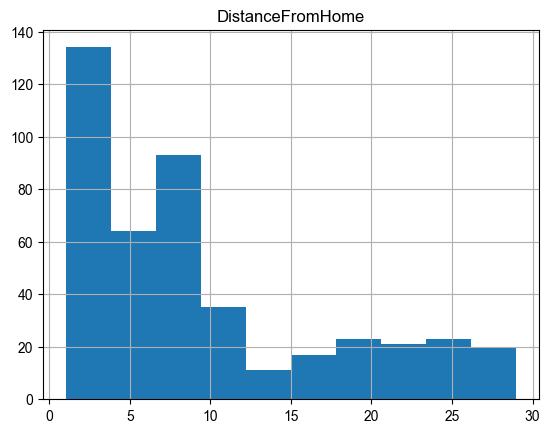

>>> Current breaks:
2.0,7.0,8.0,9.0,10.0,11.0,19.0 



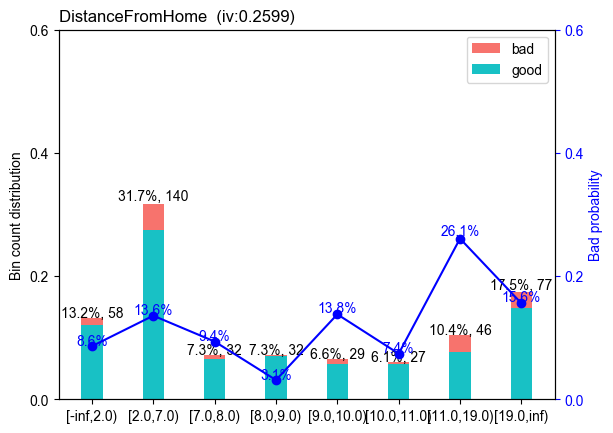

>>> Adjust breaks for (1/13) DistanceFromHome?
1: next 
2: yes 
3: back
[INFO] creating woe binning ...
>>> Current breaks:
 



/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()


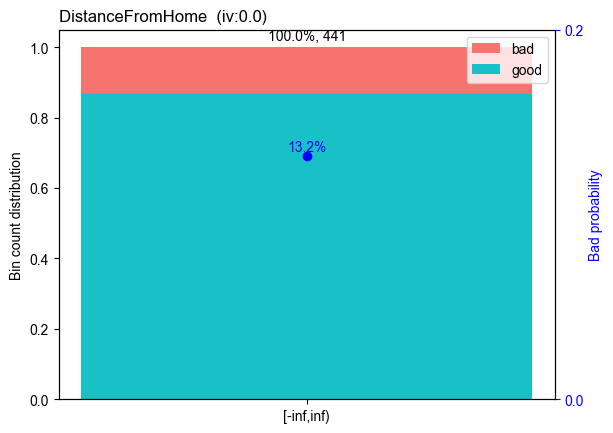

>>> Adjust breaks for (1/13) DistanceFromHome?
1: next 
2: yes 
3: back
-------- 1/13 DistanceFromHome --------
>>> dt[DistanceFromHome].describe(): 
count    441.000000
mean       9.365079
std        8.078341
min        1.000000
25%        3.000000
50%        7.000000
75%       14.000000
max       29.000000
Name: DistanceFromHome, dtype: float64 



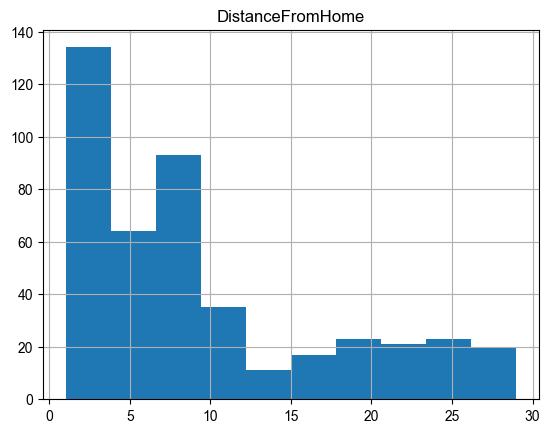

>>> Current breaks:
2.0,7.0,8.0,9.0,10.0,11.0,19.0 



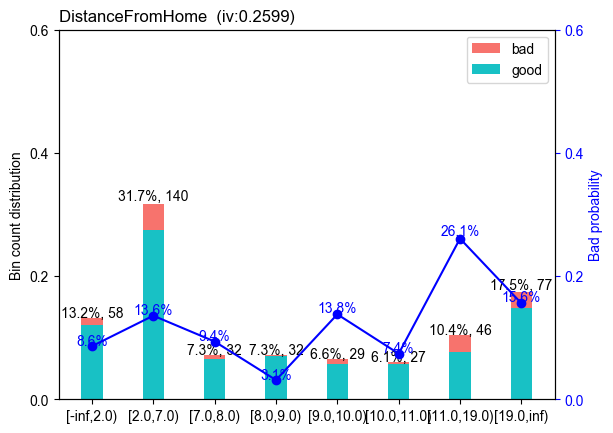

>>> Adjust breaks for (1/13) DistanceFromHome?
1: next 
2: yes 
3: back
-------- 2/13 EnvironmentSatisfaction --------
>>> dt[EnvironmentSatisfaction].describe(): 
count    441.000000
mean       2.718821
std        1.106935
min        1.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        4.000000
Name: EnvironmentSatisfaction, dtype: float64 

>>> dt[EnvironmentSatisfaction].value_counts(): 
EnvironmentSatisfaction
4.0    137
3.0    131
1.0     88
2.0     85
Name: count, dtype: int64 

>>> Current breaks:
2.0,3.0,4.0 



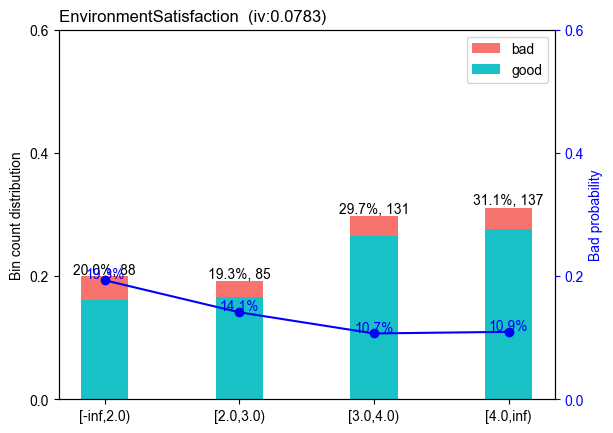

>>> Adjust breaks for (2/13) EnvironmentSatisfaction?
1: next 
2: yes 
3: back
-------- 3/13 JobLevel --------
>>> dt[JobLevel].describe(): 
count    441.000000
mean       2.131519
std        1.144524
min        1.000000
25%        1.000000
50%        2.000000
75%        3.000000
max        5.000000
Name: JobLevel, dtype: float64 

>>> dt[JobLevel].value_counts(): 
JobLevel
1.0    156
2.0    154
3.0     72
4.0     35
5.0     24
Name: count, dtype: int64 

>>> Current breaks:
2.0,3.0 



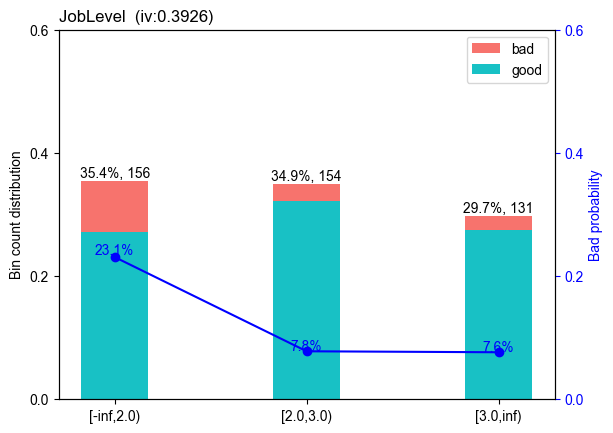

>>> Adjust breaks for (3/13) JobLevel?
1: next 
2: yes 
3: back
-------- 4/13 JobSatisfaction --------
>>> dt[JobSatisfaction].describe(): 
count    441.000000
mean       2.807256
std        1.089847
min        1.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        4.000000
Name: JobSatisfaction, dtype: float64 

>>> dt[JobSatisfaction].value_counts(): 
JobSatisfaction
4.0    148
3.0    139
1.0     79
2.0     75
Name: count, dtype: int64 

>>> Current breaks:
2.0,3.0,4.0 



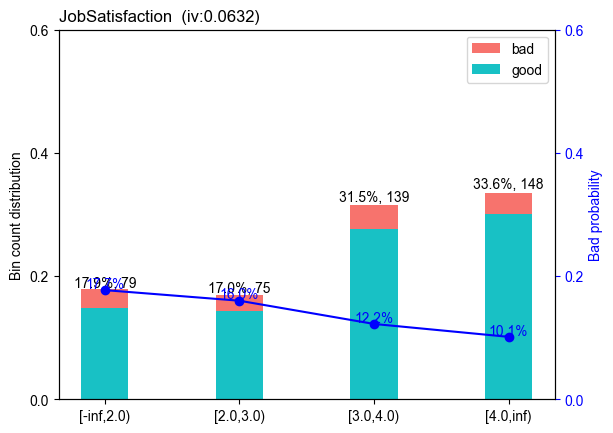

>>> Adjust breaks for (4/13) JobSatisfaction?
1: next 
2: yes 
3: back
-------- 5/13 JobStability --------
>>> dt[JobStability].describe(): 
count    441.000000
mean       0.592641
std        0.335770
min        0.000000
25%        0.380952
50%        0.666667
75%        0.875000
max        1.000000
Name: JobStability, dtype: float64 



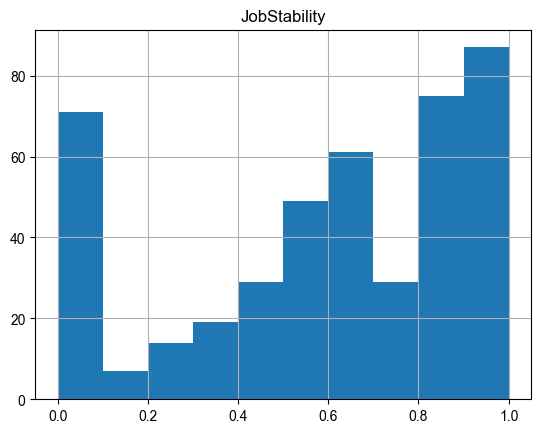

>>> Current breaks:
0.02,0.52,0.68,0.8200000000000001,0.9400000000000001 



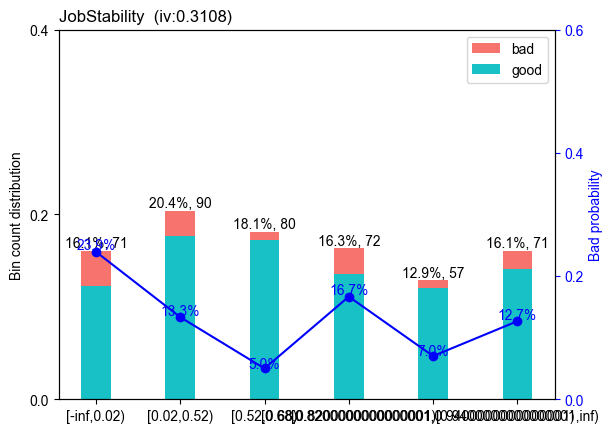

>>> Adjust breaks for (5/13) JobStability?
1: next 
2: yes 
3: back
[INFO] creating woe binning ...
>>> Current breaks:
2.0 



/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()


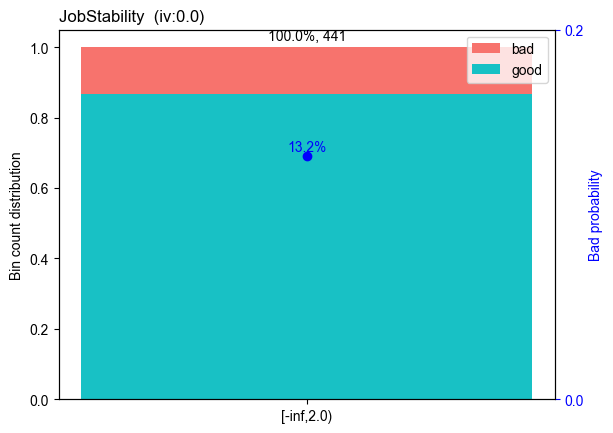

>>> Adjust breaks for (5/13) JobStability?
1: next 
2: yes 
3: back
-------- 4/13 JobSatisfaction --------
>>> dt[JobSatisfaction].describe(): 
count    441.000000
mean       2.807256
std        1.089847
min        1.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        4.000000
Name: JobSatisfaction, dtype: float64 

>>> dt[JobSatisfaction].value_counts(): 
JobSatisfaction
4.0    148
3.0    139
1.0     79
2.0     75
Name: count, dtype: int64 

>>> Current breaks:
2.0,3.0,4.0 



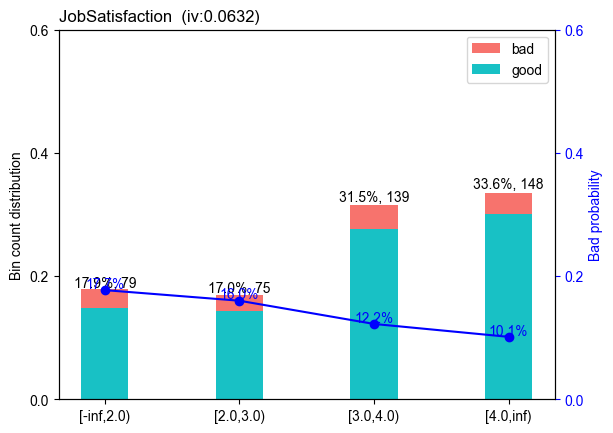

>>> Adjust breaks for (4/13) JobSatisfaction?
1: next 
2: yes 
3: back
-------- 5/13 JobStability --------
>>> dt[JobStability].describe(): 
count    441.000000
mean       0.592641
std        0.335770
min        0.000000
25%        0.380952
50%        0.666667
75%        0.875000
max        1.000000
Name: JobStability, dtype: float64 



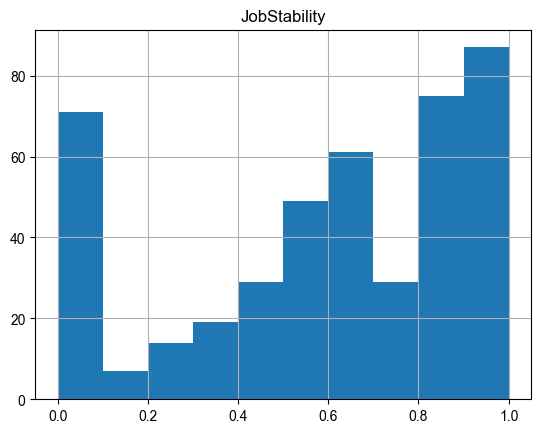

>>> Current breaks:
0.02,0.52,0.68,0.8200000000000001,0.9400000000000001 



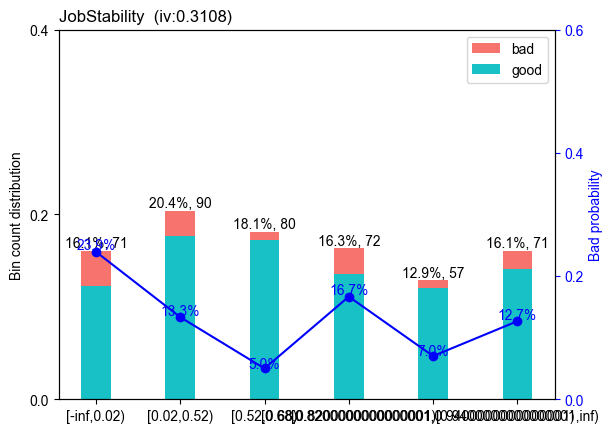

>>> Adjust breaks for (5/13) JobStability?
1: next 
2: yes 
3: back
[INFO] creating woe binning ...
>>> Current breaks:
2.0 



/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()


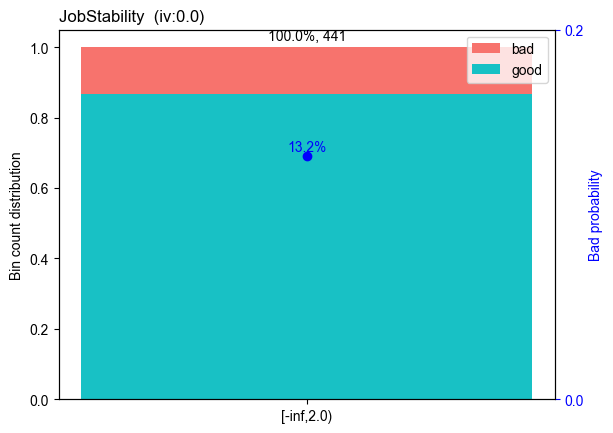

>>> Adjust breaks for (5/13) JobStability?
1: next 
2: yes 
3: back
-------- 4/13 JobSatisfaction --------
>>> dt[JobSatisfaction].describe(): 
count    441.000000
mean       2.807256
std        1.089847
min        1.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        4.000000
Name: JobSatisfaction, dtype: float64 

>>> dt[JobSatisfaction].value_counts(): 
JobSatisfaction
4.0    148
3.0    139
1.0     79
2.0     75
Name: count, dtype: int64 

>>> Current breaks:
2.0,3.0,4.0 



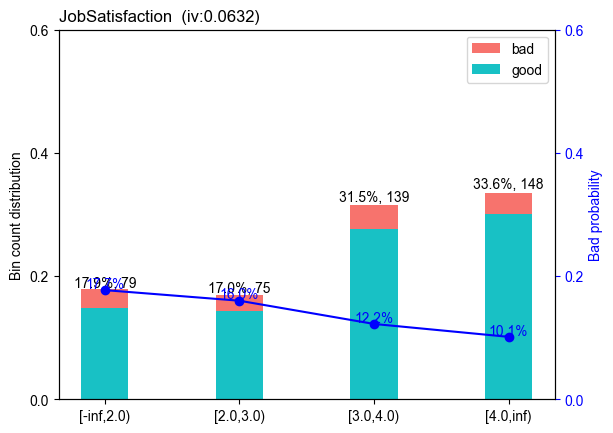

>>> Adjust breaks for (4/13) JobSatisfaction?
1: next 
2: yes 
3: back
-------- 5/13 JobStability --------
>>> dt[JobStability].describe(): 
count    441.000000
mean       0.592641
std        0.335770
min        0.000000
25%        0.380952
50%        0.666667
75%        0.875000
max        1.000000
Name: JobStability, dtype: float64 



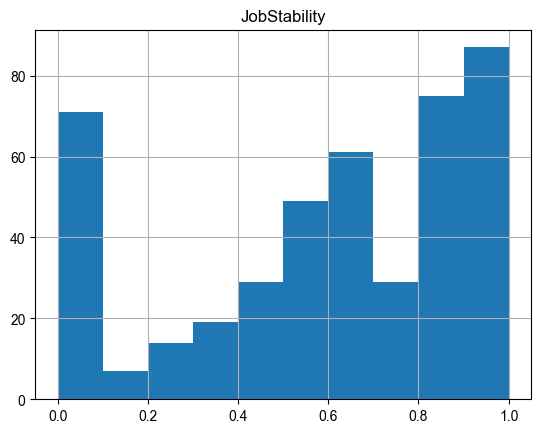

>>> Current breaks:
0.02,0.52,0.68,0.8200000000000001,0.9400000000000001 



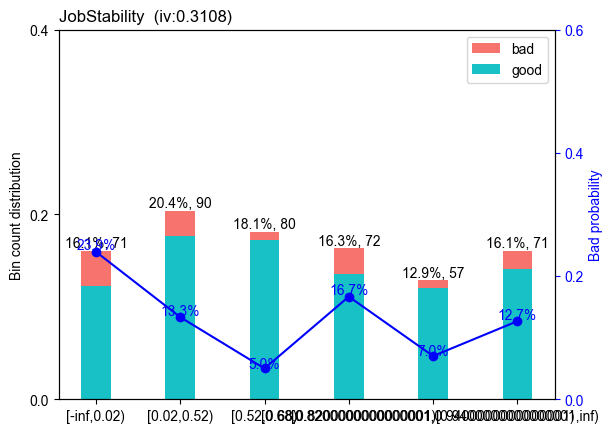

>>> Adjust breaks for (5/13) JobStability?
1: next 
2: yes 
3: back
-------- 6/13 LeaderTurnRate --------
>>> dt[LeaderTurnRate].describe(): 
count    441.000000
mean       2.882086
std        4.009610
min        0.000000
25%        1.000000
50%        1.000000
75%        3.000000
max       26.000000
Name: LeaderTurnRate, dtype: float64 



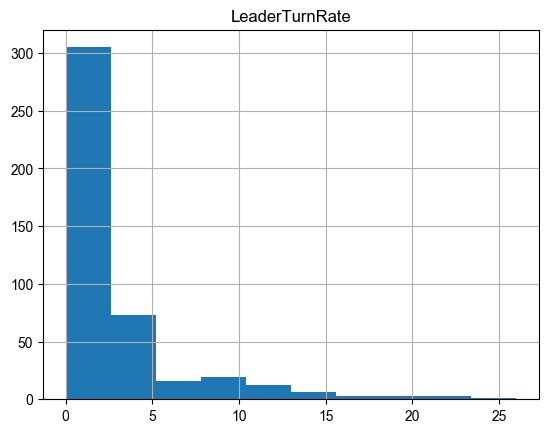

>>> Current breaks:
2.0,4.0,6.0 



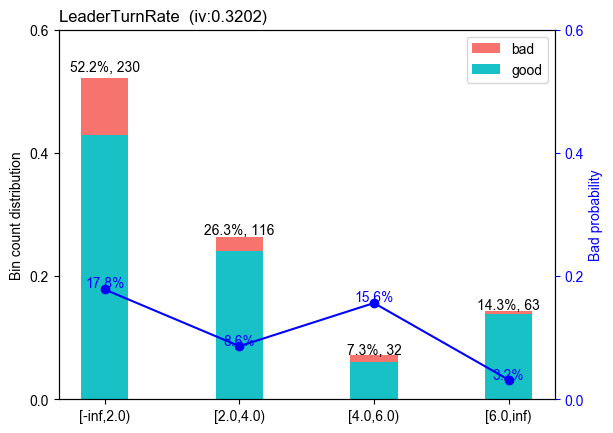

>>> Adjust breaks for (6/13) LeaderTurnRate?
1: next 
2: yes 
3: back
-------- 7/13 NumCompaniesWorked --------
>>> dt[NumCompaniesWorked].describe(): 
count    441.000000
mean       2.925170
std        2.630473
min        0.000000
25%        1.000000
50%        2.000000
75%        5.000000
max        9.000000
Name: NumCompaniesWorked, dtype: float64 



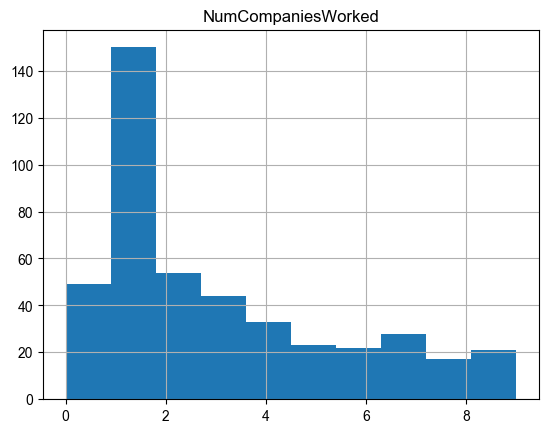

>>> Current breaks:
1.0,2.0,3.0,4.0,5.0,8.0 



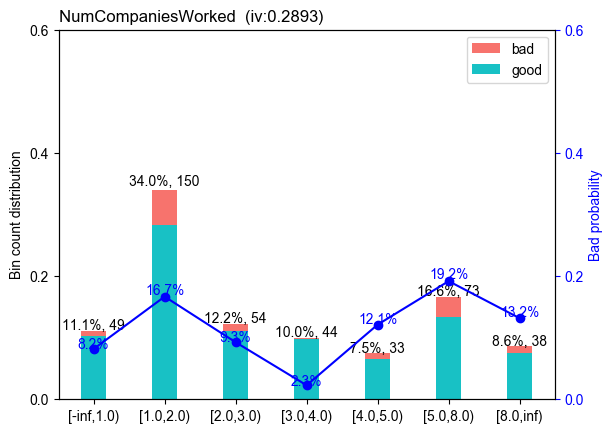

>>> Adjust breaks for (7/13) NumCompaniesWorked?
1: next 
2: yes 
3: back
[INFO] creating woe binning ...
>>> Current breaks:
2.0 



/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()


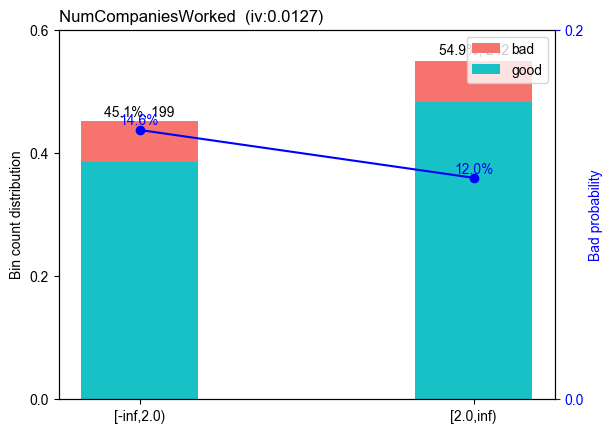

>>> Adjust breaks for (7/13) NumCompaniesWorked?
1: next 
2: yes 
3: back
-------- 6/13 LeaderTurnRate --------
>>> dt[LeaderTurnRate].describe(): 
count    441.000000
mean       2.882086
std        4.009610
min        0.000000
25%        1.000000
50%        1.000000
75%        3.000000
max       26.000000
Name: LeaderTurnRate, dtype: float64 



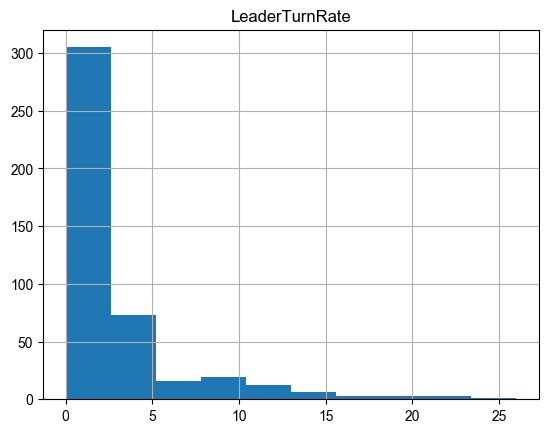

>>> Current breaks:
2.0,4.0,6.0 



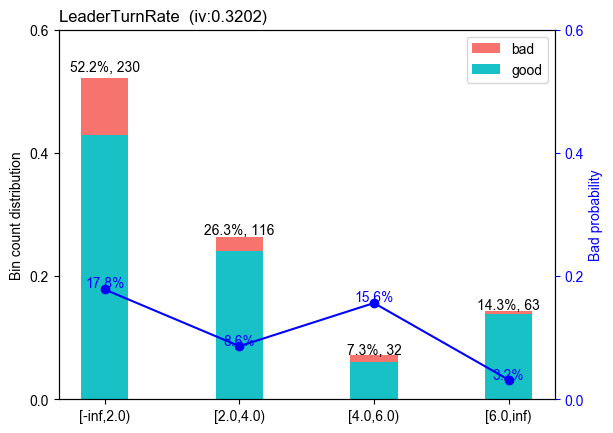

>>> Adjust breaks for (6/13) LeaderTurnRate?
1: next 
2: yes 
3: back
-------- 7/13 NumCompaniesWorked --------
>>> dt[NumCompaniesWorked].describe(): 
count    441.000000
mean       2.925170
std        2.630473
min        0.000000
25%        1.000000
50%        2.000000
75%        5.000000
max        9.000000
Name: NumCompaniesWorked, dtype: float64 



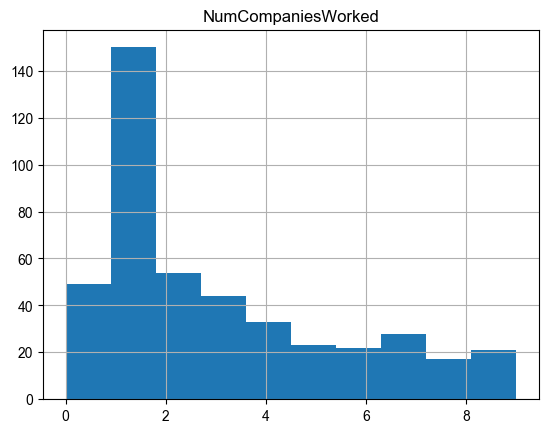

>>> Current breaks:
1.0,2.0,3.0,4.0,5.0,8.0 



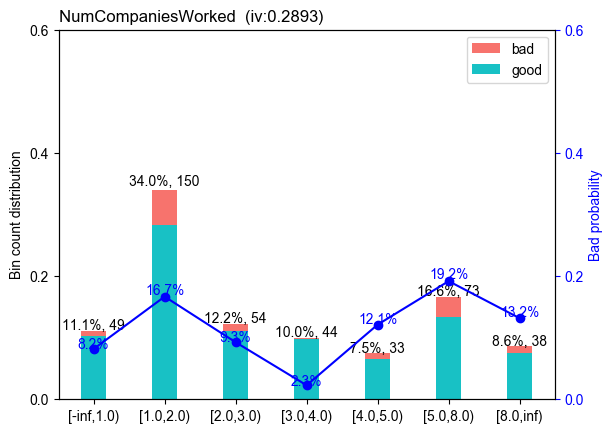

>>> Adjust breaks for (7/13) NumCompaniesWorked?
1: next 
2: yes 
3: back
-------- 8/13 OverTime --------
>>> dt[OverTime].describe(): 
count    441.000000
mean       0.260771
std        0.439554
min        0.000000
25%        0.000000
50%        0.000000
75%        1.000000
max        1.000000
Name: OverTime, dtype: float64 

>>> dt[OverTime].value_counts(): 
OverTime
0.0    326
1.0    115
Name: count, dtype: int64 

>>> Current breaks:
1.0 



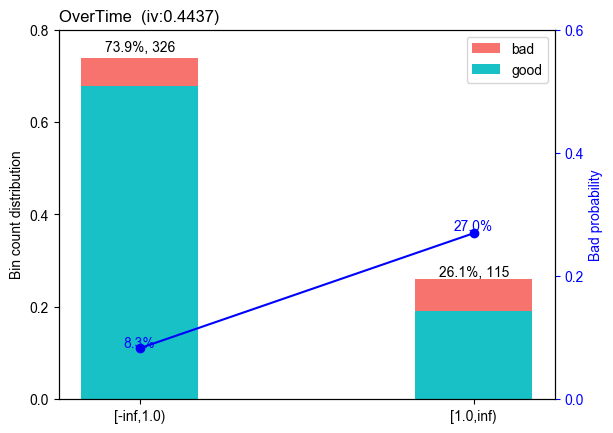

>>> Adjust breaks for (8/13) OverTime?
1: next 
2: yes 
3: back
-------- 9/13 PercentSalaryHike --------
>>> dt[PercentSalaryHike].describe(): 
count    441.000000
mean      15.430839
std        3.744736
min       11.000000
25%       12.000000
50%       14.000000
75%       18.000000
max       25.000000
Name: PercentSalaryHike, dtype: float64 



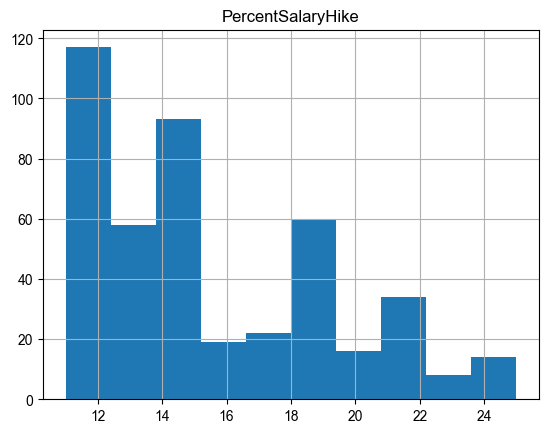

>>> Current breaks:
12.0,20.0,22.0 



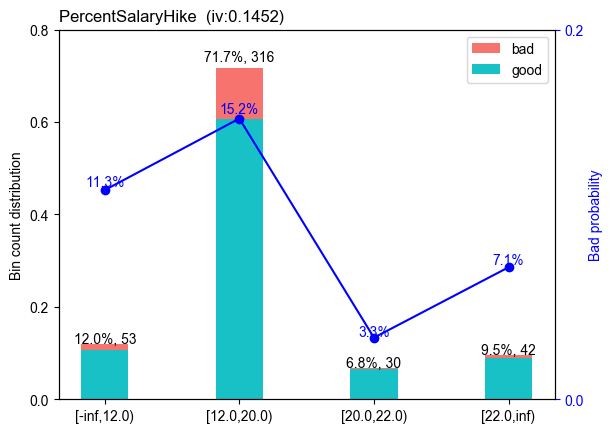

>>> Adjust breaks for (9/13) PercentSalaryHike?
1: next 
2: yes 
3: back
-------- 10/13 PerformanceRating --------
>>> dt[PerformanceRating].describe(): 
count    441.000000
mean       3.163265
std        0.370027
min        3.000000
25%        3.000000
50%        3.000000
75%        3.000000
max        4.000000
Name: PerformanceRating, dtype: float64 

>>> dt[PerformanceRating].value_counts(): 
PerformanceRating
3.0    369
4.0     72
Name: count, dtype: int64 

>>> Current breaks:
4.0 



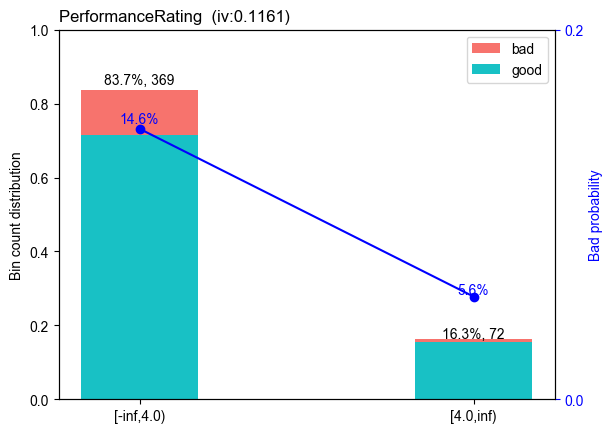

>>> Adjust breaks for (10/13) PerformanceRating?
1: next 
2: yes 
3: back
-------- 11/13 RelationshipSatisfaction --------
>>> dt[RelationshipSatisfaction].describe(): 
count    441.000000
mean       2.666667
std        1.107823
min        1.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        4.000000
Name: RelationshipSatisfaction, dtype: float64 

>>> dt[RelationshipSatisfaction].value_counts(): 
RelationshipSatisfaction
3.0    140
4.0    125
1.0     96
2.0     80
Name: count, dtype: int64 

>>> Current breaks:
2.0,3.0,4.0 



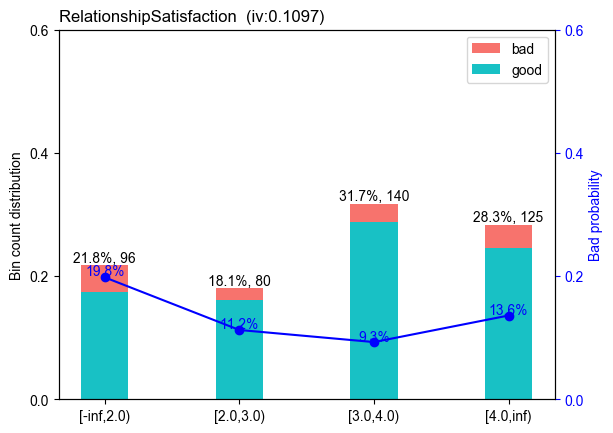

>>> Adjust breaks for (11/13) RelationshipSatisfaction?
1: next 
2: yes 
3: back
-------- 12/13 StockOptionLevel --------
>>> dt[StockOptionLevel].describe(): 
count    441.000000
mean       0.852608
std        0.846677
min        0.000000
25%        0.000000
50%        1.000000
75%        1.000000
max        3.000000
Name: StockOptionLevel, dtype: float64 

>>> dt[StockOptionLevel].value_counts(): 
StockOptionLevel
1.0    191
0.0    170
2.0     55
3.0     25
Name: count, dtype: int64 

>>> Current breaks:
1.0,2.0,3.0 



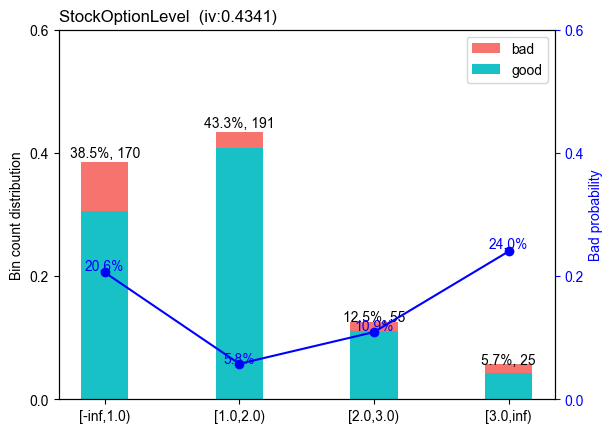

>>> Adjust breaks for (12/13) StockOptionLevel?
1: next 
2: yes 
3: back
-------- 13/13 TrainingTimesLastYear --------
>>> dt[TrainingTimesLastYear].describe(): 
count    441.000000
mean       2.766440
std        1.309878
min        0.000000
25%        2.000000
50%        3.000000
75%        3.000000
max        6.000000
Name: TrainingTimesLastYear, dtype: float64 

>>> dt[TrainingTimesLastYear].value_counts(): 
TrainingTimesLastYear
2.0    165
3.0    149
5.0     33
4.0     33
6.0     21
1.0     20
0.0     20
Name: count, dtype: int64 

>>> Current breaks:
2.0,3.0,5.0 



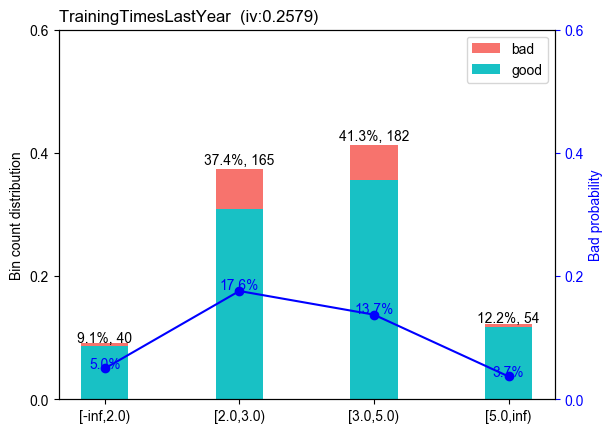

>>> Adjust breaks for (13/13) TrainingTimesLastYear?
1: next 
2: yes 
3: back


/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/woebin.py:1515: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  breaks_list = "{"+', '.join('\''+bins_breakslist.index[i]+'\': ['+bins_breakslist[i]+']' for i in np.arange(len(bins_breakslist)))+"}"


In [43]:
# 根据初步分箱结果进行交互式调整
breaks_adj = sc.woebin_adj(data_drop, "Attrition", bins_drop)


In [44]:
# 将调整后的分箱切点应用到分箱函数中，重新生成分箱结果
bins_adj = sc.woebin(data_drop, y="Attrition", breaks_list=breaks_adj)

[INFO] creating woe binning ...


/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/condition_fun.py:40: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  datetime_cols = dat.apply(pd.to_numeric,errors='ignore').select_dtypes(object).apply(pd.to_datetime,errors='ignore').select_dtypes('datetime64').columns.tolist()


/var/folders/y2/wt3c181576xcp7vkwx_d9h1h0000gn/T/ipykernel_22638/2874173766.py:49: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  bins = bins.groupby('variable', group_keys=False).apply(gb_distr)


{'PercentSalaryHike': <Figure size 1800x1200 with 2 Axes>,
 'PerformanceRating': <Figure size 1800x1200 with 2 Axes>,
 'JobSatisfaction': <Figure size 1800x1200 with 2 Axes>,
 'MaritalStatus': <Figure size 1800x1200 with 2 Axes>,
 'EnvironmentSatisfaction': <Figure size 1800x1200 with 2 Axes>,
 'JobStability': <Figure size 1800x1200 with 2 Axes>,
 'OverTime': <Figure size 1800x1200 with 2 Axes>,
 'StockOptionLevel': <Figure size 1800x1200 with 2 Axes>,
 'DistanceFromHome': <Figure size 1800x1200 with 2 Axes>,
 'JobLevel': <Figure size 1800x1200 with 2 Axes>,
 'NumCompaniesWorked': <Figure size 1800x1200 with 2 Axes>,
 'YearsSinceLastPromotion': <Figure size 1800x1200 with 2 Axes>,
 'RelationshipSatisfaction': <Figure size 1800x1200 with 2 Axes>,
 'LeaderTurnRate': <Figure size 1800x1200 with 2 Axes>,
 'TrainingTimesLastYear': <Figure size 1800x1200 with 2 Axes>}

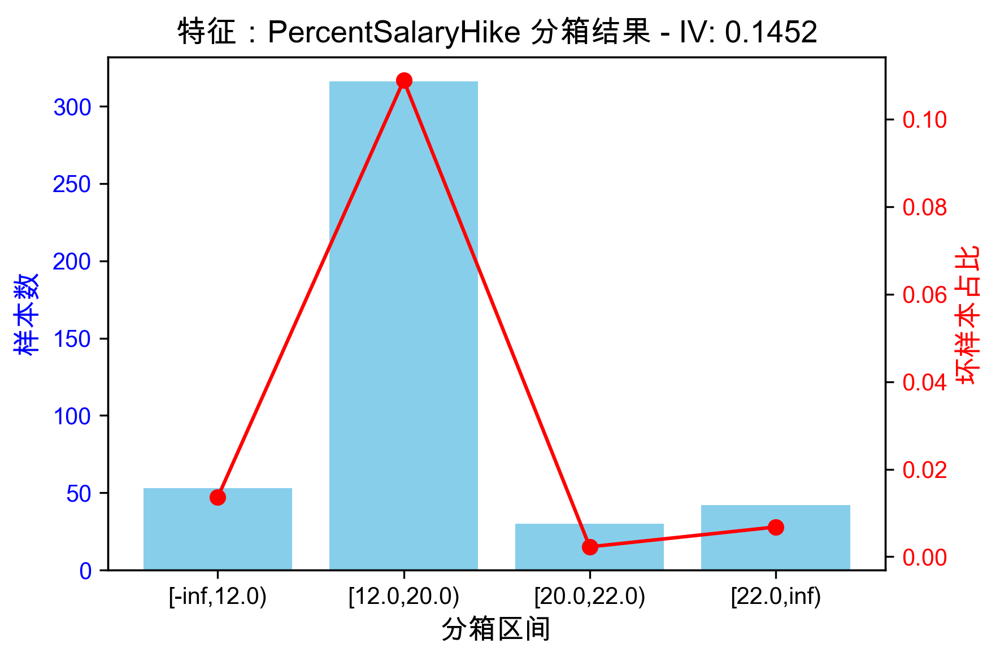

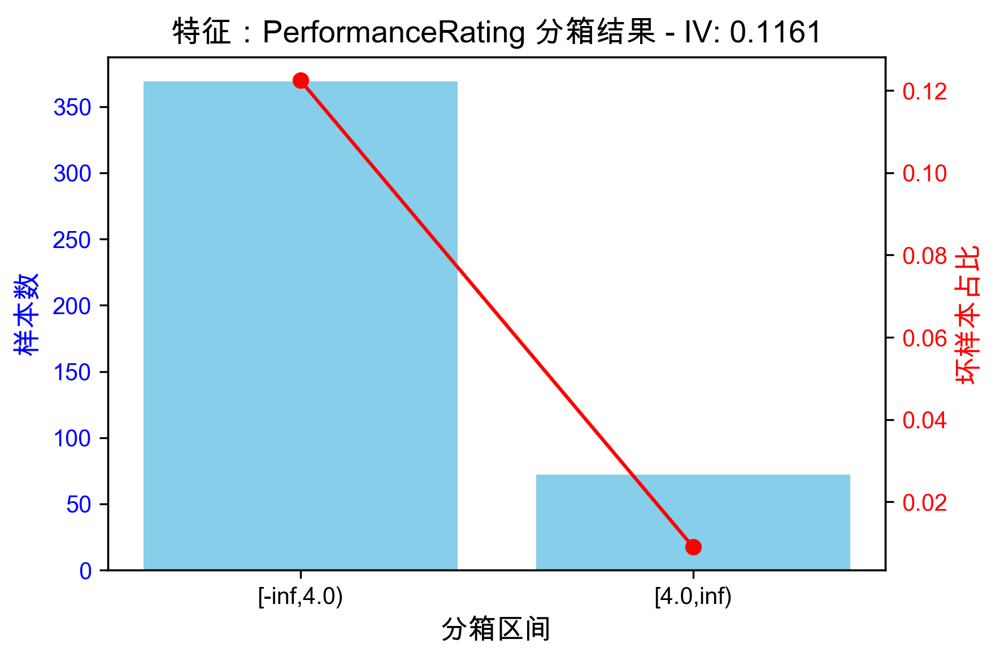

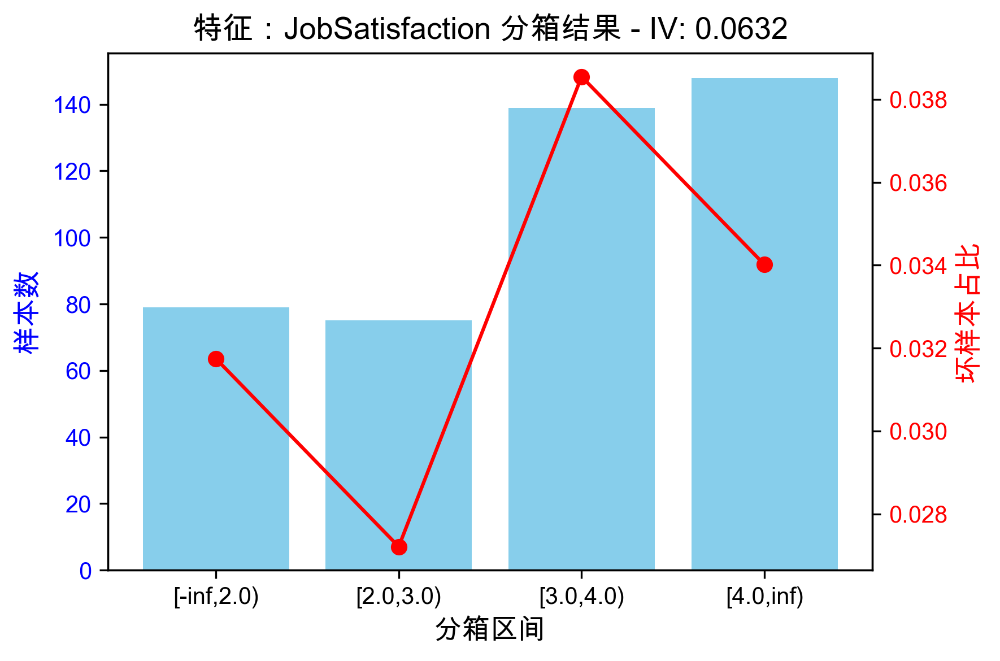

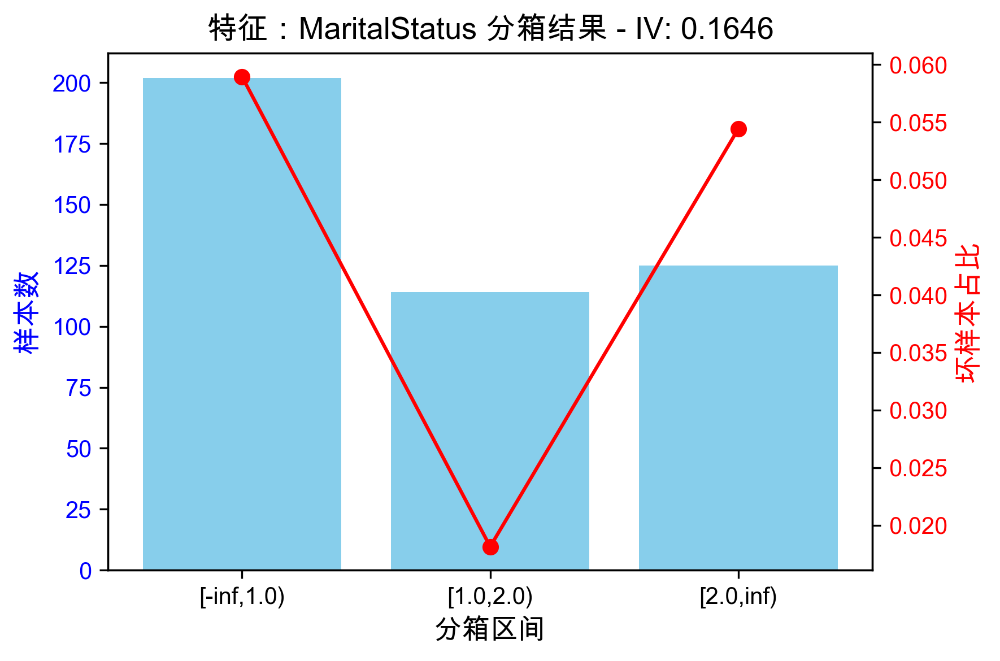

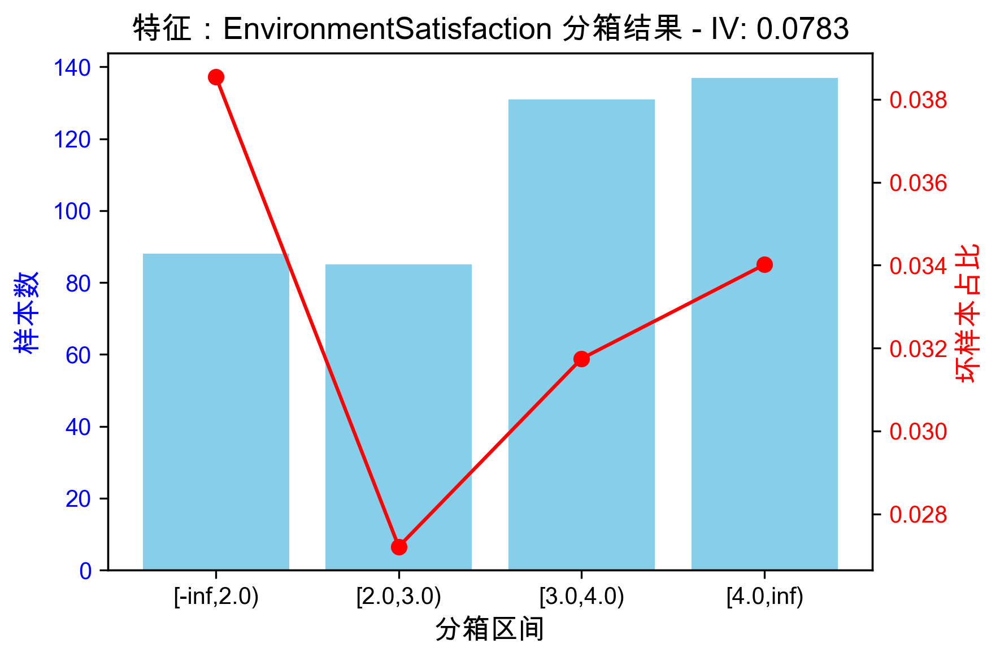

...

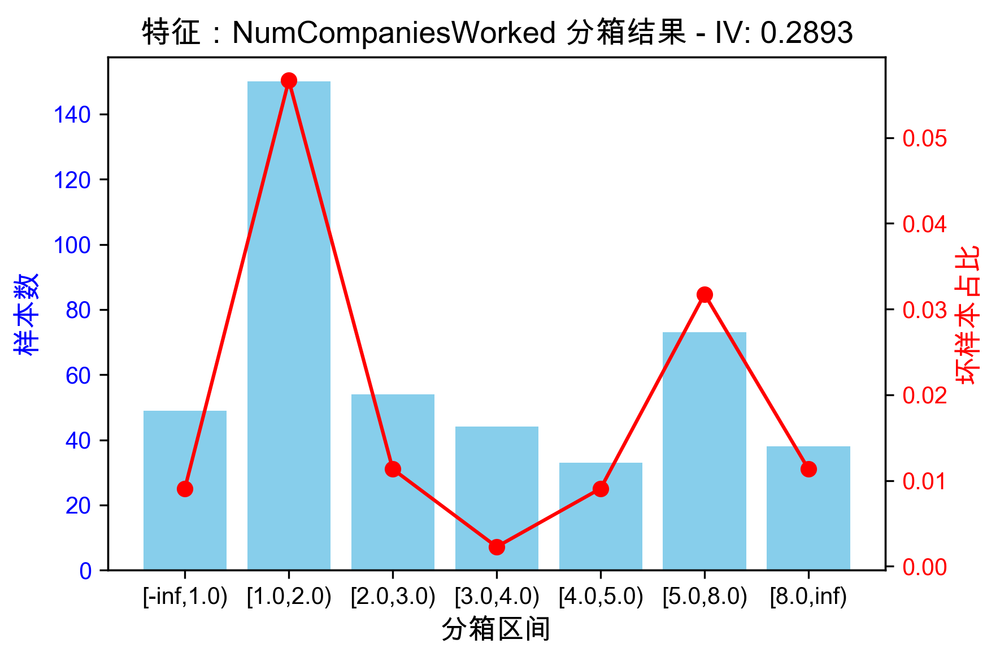

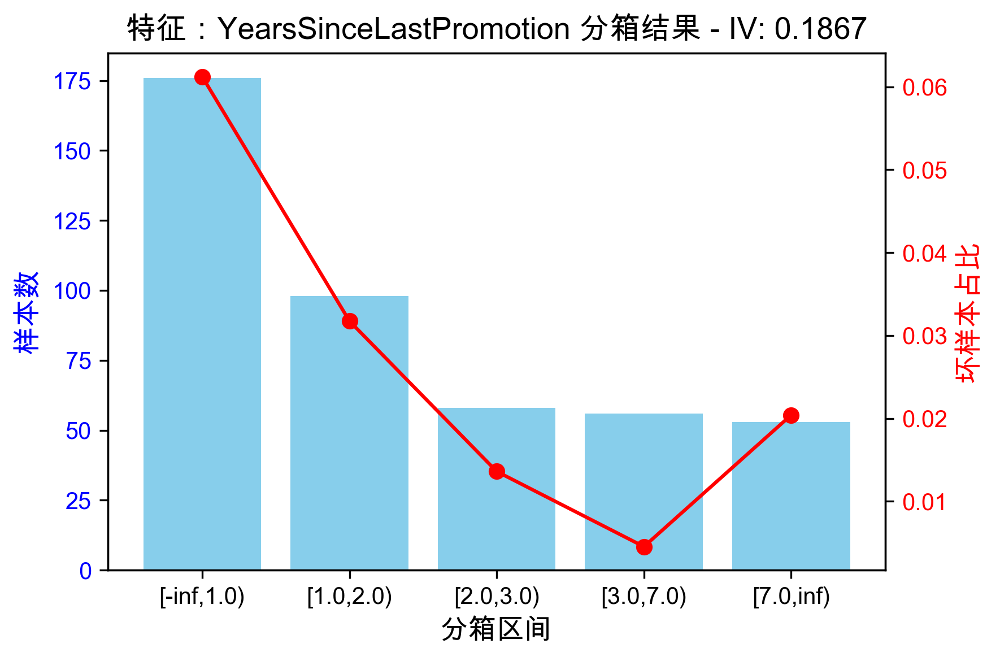

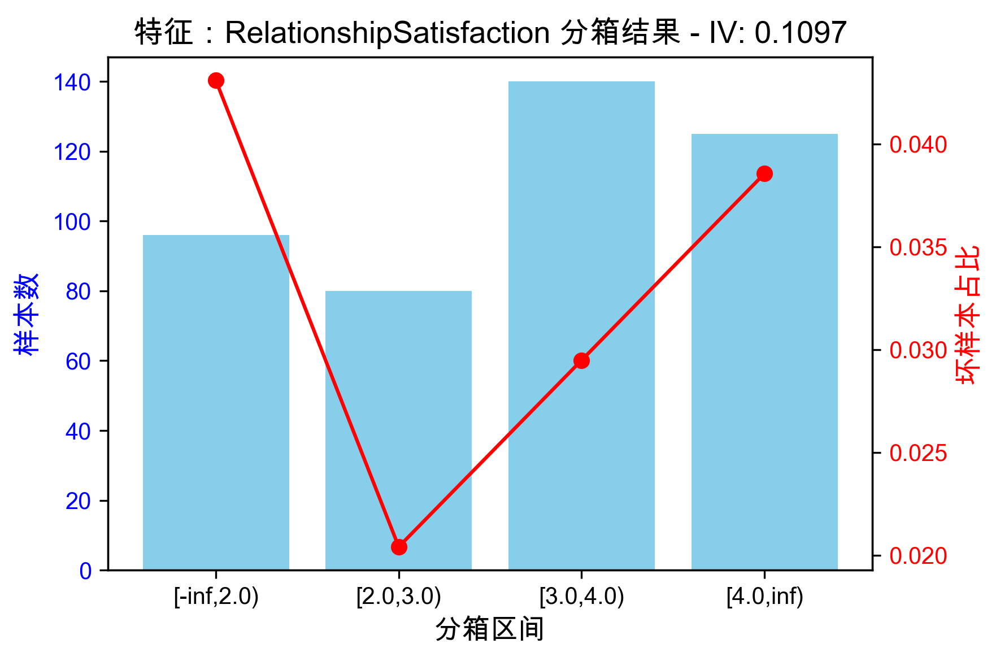

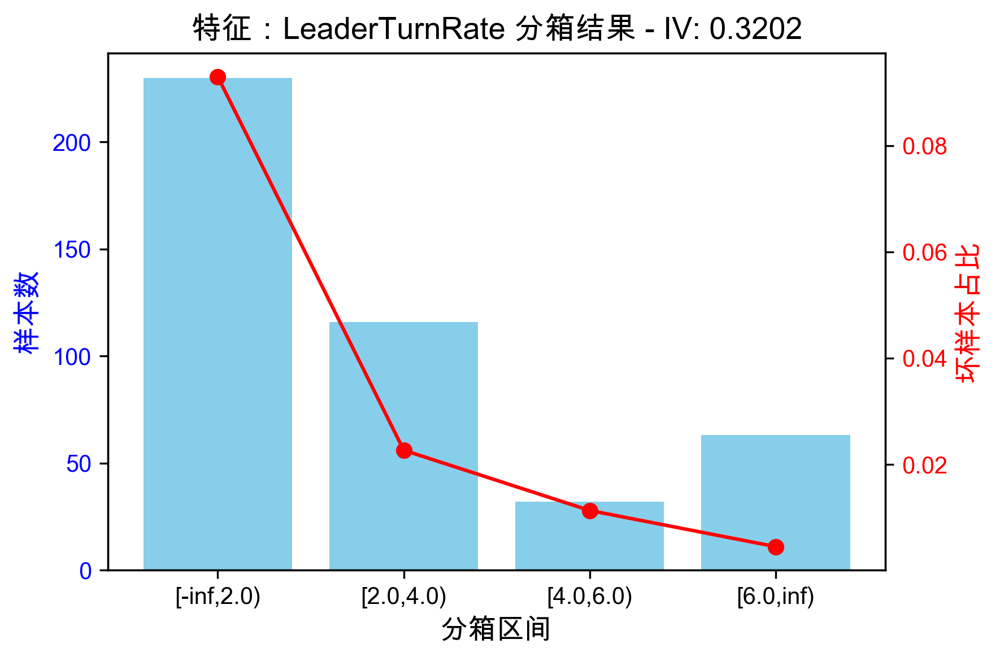

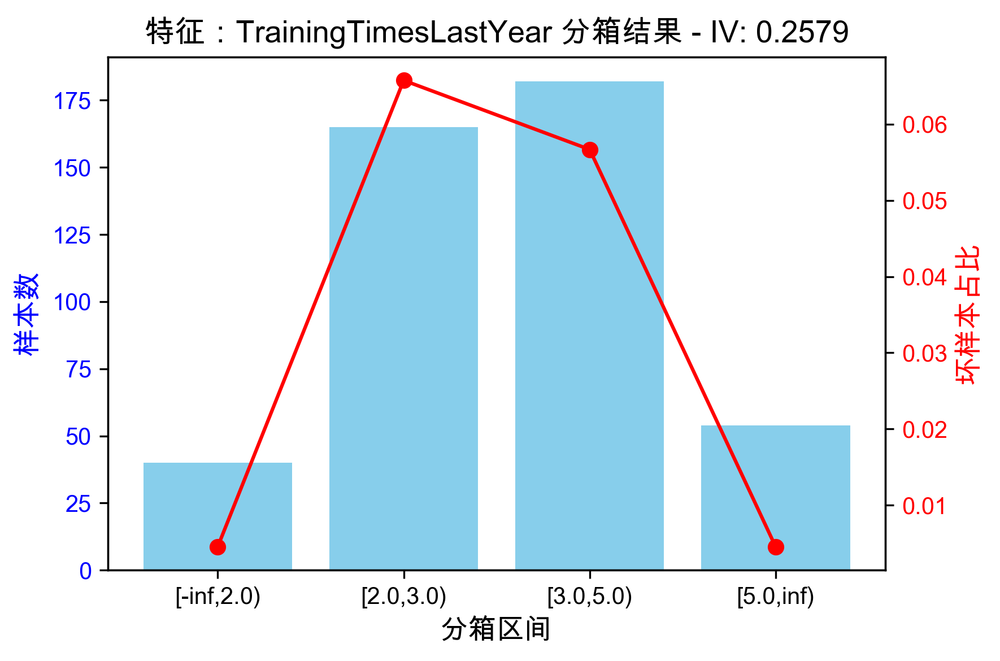

In [45]:
woebin_plot_fixed(bins_adj)

## 划分数据集

In [46]:
train, test = sc.split_df(data_drop, 'Attrition').values()
train.shape, test.shape

((309, 16), (132, 16))

## 转为WOE值 

In [ ]:
# 将训练集和测试集转换为 WOE 值
train_woe = sc.woebin_ply(train, bins_adj)
test_woe  = sc.woebin_ply(test, bins_adj)

[INFO] converting into woe values ...
[INFO] converting into woe values ...


In [48]:
# 划分自变量和因变量
y_train = train_woe["Attrition"]
X_train = train_woe.drop(columns=["Attrition"])
y_test  = test_woe["Attrition"]
X_test  = test_woe.drop(columns=["Attrition"])

## 模型构建

In [50]:
# 6. 逻辑回归建模 —— 建立信用评分模型
lr = LogisticRegression(penalty='l1', C=0.9, solver='saga', n_jobs=-1)
lr.fit(X_train, y_train)

LogisticRegression(C=0.9, n_jobs=-1, penalty='l1', solver='saga')

因数据集较少，考虑使用 K 折交叉验证重新训练模型

In [53]:
# 设置 k 折交叉验证，这里以 5 折为例
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

fold = 1
# 保存每一折的评估指标（例如 KS、AUC 等，可根据 perf_eva 返回的内容进行调整）
fold_metrics = []

# 遍历每个折次
for train_index, test_index in kf.split(data_drop, data_drop['Attrition']):
    # 拆分出当前折次的训练集和验证集
    train_fold = data_drop.iloc[train_index]
    test_fold  = data_drop.iloc[test_index]
     
    # 4. 将训练集和验证集转换成 WOE 值
    train_woe = sc.woebin_ply(train_fold, bins_adj)
    test_woe  = sc.woebin_ply(test_fold, bins_adj)
    
    # 5. 划分自变量与因变量
    y_train = train_woe['Attrition']
    X_train = train_woe.drop(columns=['Attrition'])
    y_test  = test_woe['Attrition']
    X_test  = test_woe.drop(columns=['Attrition'])
    
    # 6. 建立逻辑回归模型
    lr = LogisticRegression(penalty='l1', C=0.9, solver='saga', n_jobs=-1)
    lr.fit(X_train, y_train)
    
    # 7. 对验证集进行概率预测
    test_pred = lr.predict_proba(X_test)[:, 1]
    
    # 8. 模型评估
    # 使用 scorecardpy 提供的 perf_eva 函数进行评估，显示 KS、AUC、ROC 等指标
    # 此处设 show_plot=False，避免每折都弹出图形，可根据需要改为 True 查看折次图形
    perf = sc.perf_eva(y_test, test_pred, title=f"Fold {fold} Performance", show_plot=False)
    print(f"折次 {fold} 评估结果:")
    print(perf)
    
    # 将每折的部分指标保存起来，例如假定 perf 返回一个字典包含 'ks' 和 'auc'
    # 你可以根据实际情况从 perf 中提取指标
    fold_metrics.append(perf)
    
    fold += 1

# 9. 汇总不同折次的指标
# 这里简单示例：假定每个 perf 都包含 'ks' 和 'auc'
ks_values = [fold_metric.get('KS', np.nan) for fold_metric in fold_metrics]
auc_values = [fold_metric.get('AUC', np.nan) for fold_metric in fold_metrics]

print("\n五折交叉验证结果汇总:")
print(f"平均 KS: {np.nanmean(ks_values):.4f}, 标准差: {np.nanstd(ks_values):.4f}")
print(f"平均 AUC: {np.nanmean(auc_values):.4f}, 标准差: {np.nanstd(auc_values):.4f}")


[INFO] converting into woe values ...
[INFO] converting into woe values ...
折次 1 评估结果:
{'KS': np.float64(0.6515), 'AUC': np.float64(0.8431), 'Gini': np.float64(0.6861)}
[INFO] converting into woe values ...
[INFO] converting into woe values ...
折次 2 评估结果:
{'KS': np.float64(0.6753), 'AUC': np.float64(0.8973), 'Gini': np.float64(0.7946)}
[INFO] converting into woe values ...
[INFO] converting into woe values ...
折次 3 评估结果:
{'KS': np.float64(0.6104), 'AUC': np.float64(0.8241), 'Gini': np.float64(0.6482)}
[INFO] converting into woe values ...
[INFO] converting into woe values ...
折次 4 评估结果:
{'KS': np.float64(0.6096), 'AUC': np.float64(0.8388), 'Gini': np.float64(0.6776)}
[INFO] converting into woe values ...
[INFO] converting into woe values ...
折次 5 评估结果:
{'KS': np.float64(0.6404), 'AUC': np.float64(0.8662), 'Gini': np.float64(0.7325)}

五折交叉验证结果汇总:
平均 KS: 0.6374, 标准差: 0.0251
平均 AUC: 0.8539, 标准差: 0.0256


## 构建评分卡

In [54]:
# 构建评分卡
card = sc.scorecard(bins_adj, lr, X_train.columns)

In [55]:
# 根据评分卡计算信用分
train_score = sc.scorecard_ply(train, card, print_step=0)
test_score  = sc.scorecard_ply(test, card, print_step=0)

/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/scorecard.py:353: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat_score.loc[:,'score'] = card_basepoints + dat_score.sum(axis=1)
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/scorecard.py:353: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat_score.loc[:,'score'] = card_basepoints + dat_score.sum(axis=1)


In [56]:
train_score

,score
0,689.0
1,482.0
4,351.0
5,425.0
6,505.0
...,...
430,645.0
433,662.0
435,285.0
439,529.0


In [57]:
test_score

,score
2,665.0
3,498.0
7,392.0
8,898.0
9,496.0
...,...
432,683.0
434,607.0
436,648.0
437,686.0


In [ ]:
"""
    下面那个图太小了，直接全局覆盖
"""
plt.rcParams['figure.figsize'] = (30, 24)
plt.rcParams['figure.dpi'] = 300

/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/perf.py:470: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dt_bae = dat.groupby(['ae','bin']).size().reset_index(name='N')\
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/perf.py:470: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  dt_bae = dat.groupby(['ae','bin']).size().reset_index(name='N')\
/Users/solidify/miniconda3/envs/torch_env/lib/python3.10/site-packages/scorecardpy/perf.py:511: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=Fa

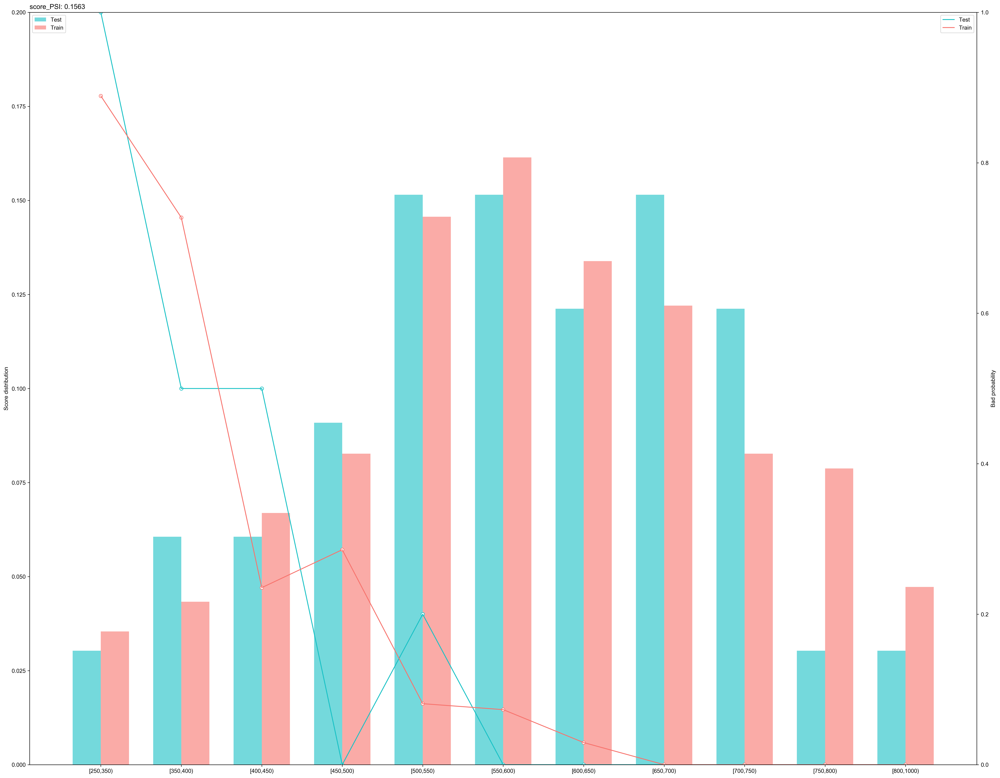

In [ ]:
# 计算 PSI 分析，检测训练集与测试集之间评分的稳定性
psi_result = sc.perf_psi(
    score = {'Train': train_score, 'Test': test_score},
    label = {'Train': y_train, 'Test': y_test}
)


# 可视化评分卡

In [71]:
card

{'basepoints':      variable  bin  points
 0  basepoints  NaN   517.0,
 'PercentSalaryHike':             variable          bin  points
 0  PercentSalaryHike  [-inf,12.0)     9.0
 1  PercentSalaryHike  [12.0,20.0)    -9.0
 2  PercentSalaryHike  [20.0,22.0)    81.0
 3  PercentSalaryHike   [22.0,inf)    37.0,
 'DistanceFromHome':             variable          bin  points
 29  DistanceFromHome   [-inf,2.0)    23.0
 30  DistanceFromHome    [2.0,7.0)    -2.0
 31  DistanceFromHome    [7.0,8.0)    18.0
 32  DistanceFromHome    [8.0,9.0)    74.0
 33  DistanceFromHome   [9.0,10.0)    -3.0
 34  DistanceFromHome  [10.0,11.0)    31.0
 35  DistanceFromHome  [11.0,19.0)   -41.0
 36  DistanceFromHome   [19.0,inf)    -9.0,
 'JobSatisfaction':           variable         bin  points
 6  JobSatisfaction  [-inf,2.0)    -7.0
 7  JobSatisfaction   [2.0,3.0)    -5.0
 8  JobSatisfaction   [3.0,4.0)     2.0
 9  JobSatisfaction   [4.0,inf)     6.0,
 'JobLevel':     variable         bin  points
 37  JobLevel  [-i

In [74]:
# 将字典转换为包含所有变量的DataFrame
full_df = pd.concat(
    {k: v.drop(columns=['variable']).reset_index(drop=True)  # 移除原有variable列
     for k, v in card.items() if k != 'basepoints'},
    names=['variable']
).reset_index(level=1, drop=True).reset_index()

In [87]:
# 直接指定默认尺寸（单位：英寸）
plt.rcParams['figure.figsize'] = [6.4, 4.8]  # 默认值通常是 (6.4, 4.8)

In [88]:
def plot_scorecard(feature_df, base_score=517.0):
    plt.figure(figsize=(10, 6))
    
    # 优化分箱标签显示（使用正则表达式处理浮点精度）
    bins = [
        re.sub(r"0+(\d{2})(\.\d+)?0*", r"\1\2",  # 处理浮点精度问题
        str(b).replace('inf', '∞')
              .replace('8200000000000001', '82')
              .replace('9400000000000001', '94'))
        for b in feature_df['bin']
    ]
    
    # 绘制水平条形图
    bars = plt.barh(
        y=bins,
        width=feature_df['points'],
        color=['#2ecc71' if p > 0 else '#e74c3c' for p in feature_df['points']],
        height=0.6
    )
    
    # 自动设置合理的坐标轴范围
    x_min = min(feature_df['points'].min() * 1.2, -50)  # 保证最小显示-50
    x_max = max(feature_df['points'].max() * 1.2, 50)   # 保证最小显示+50
    plt.xlim(x_min, x_max)

    # 添加数据标签（改进后的定位逻辑）
    for bar, value in zip(bars, feature_df['points']):
        width = bar.get_width()
        label_offset = 0.02 * (x_max - x_min)  # 动态偏移量
        
        # 确定标签位置
        if value > 0:
            label_x = width - label_offset
            ha = 'right'
        else:
            label_x = width + label_offset
            ha = 'left'
        
        # 保证标签在可见区域内
        label_x = max(min(label_x, x_max - label_offset), x_min + label_offset)
        
        plt.text(
            x=label_x,
            y=bar.get_y() + bar.get_height()/2,
            s=f"{value:+g}",
            ha=ha,
            va='center',
            color='white' if abs(value) > 10 else 'black',  # 小数值使用黑色
            fontweight='bold',
            # bbox=dict(facecolor='black', alpha=0.1, lw=0)  # 添加半透明背景
        )

    plt.title(f"{feature_df['variable'].iloc[0]} 评分规则", fontsize=14)
    plt.xlabel("分数", fontsize=12)
    plt.ylabel("分箱区间", fontsize=12)
    plt.gca().invert_yaxis()
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

基础分: 517.0


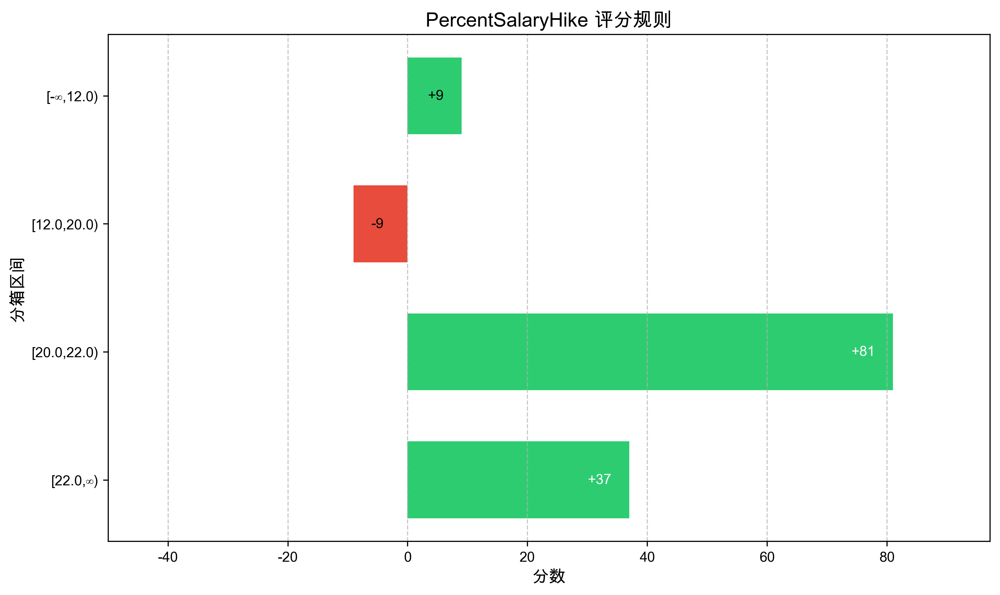

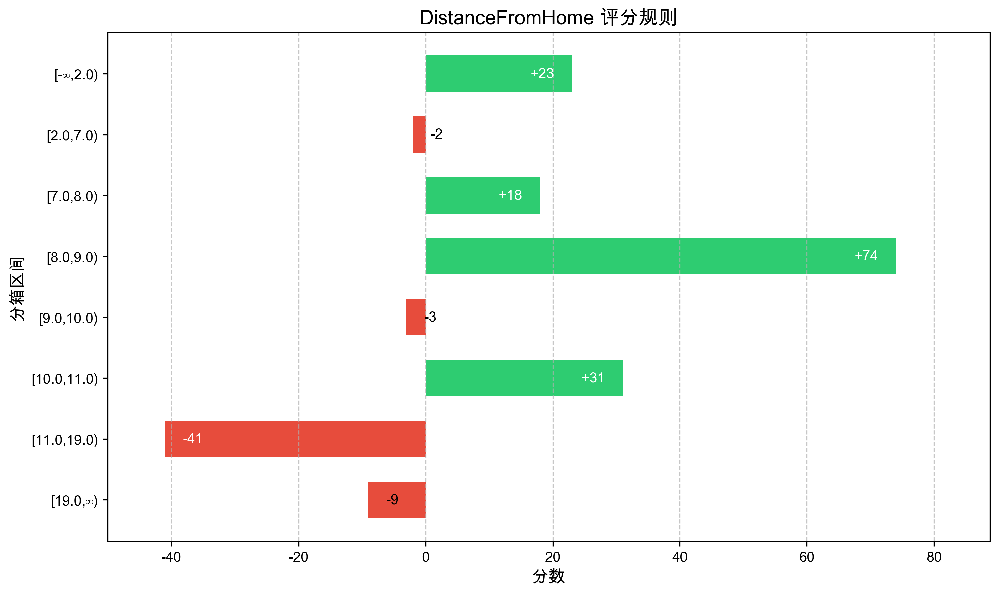

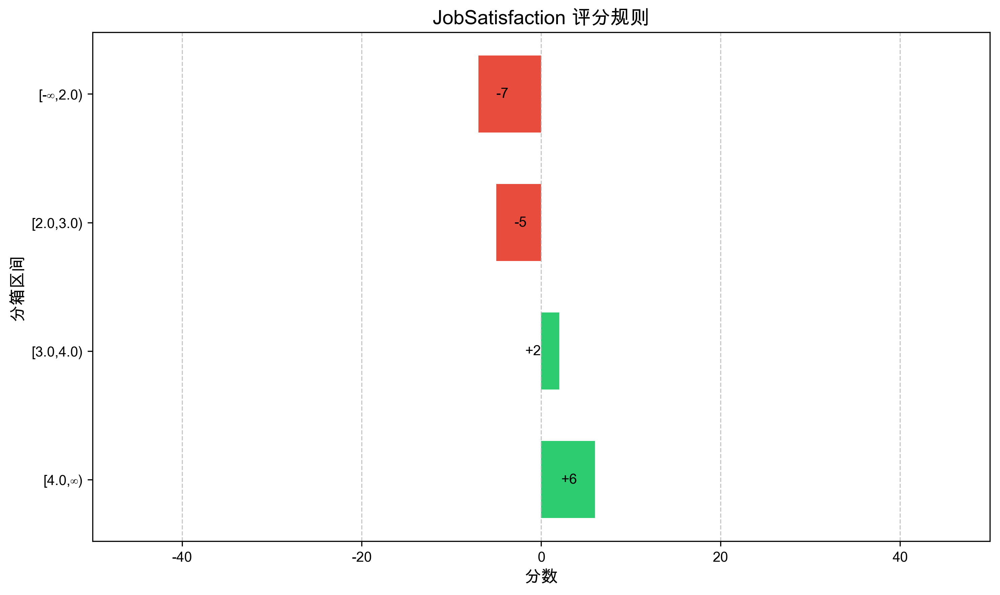

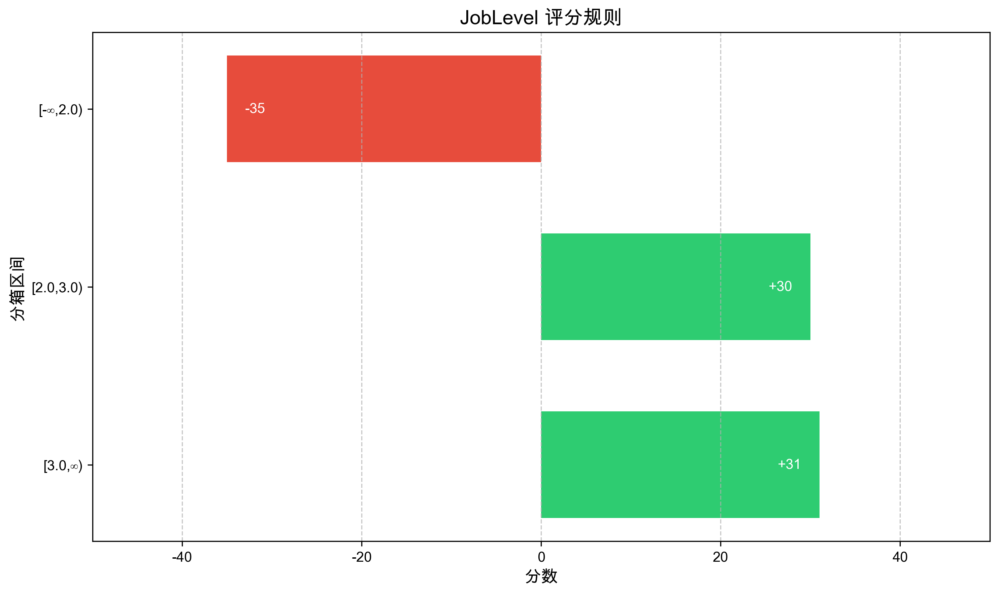

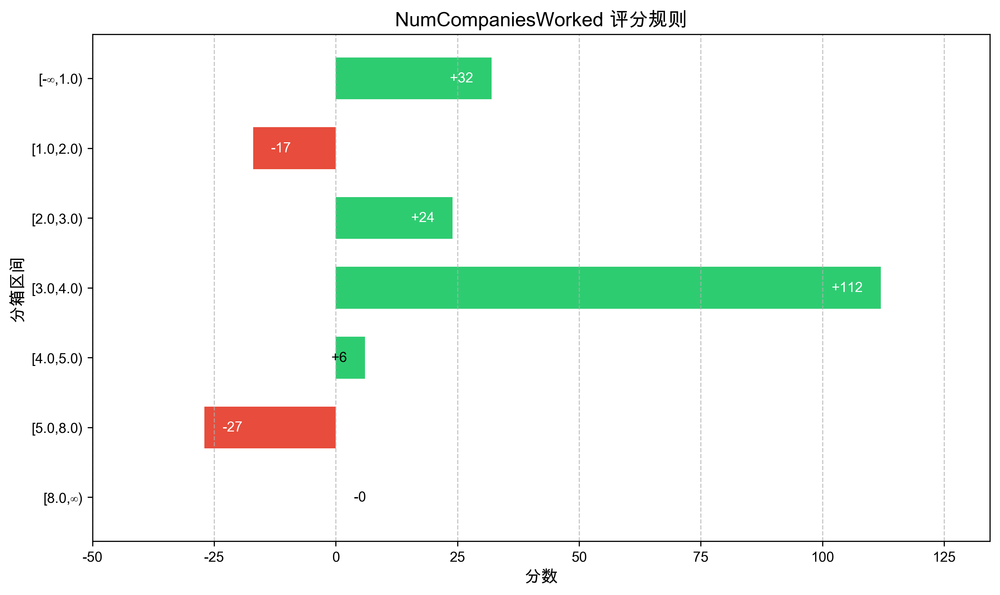

...

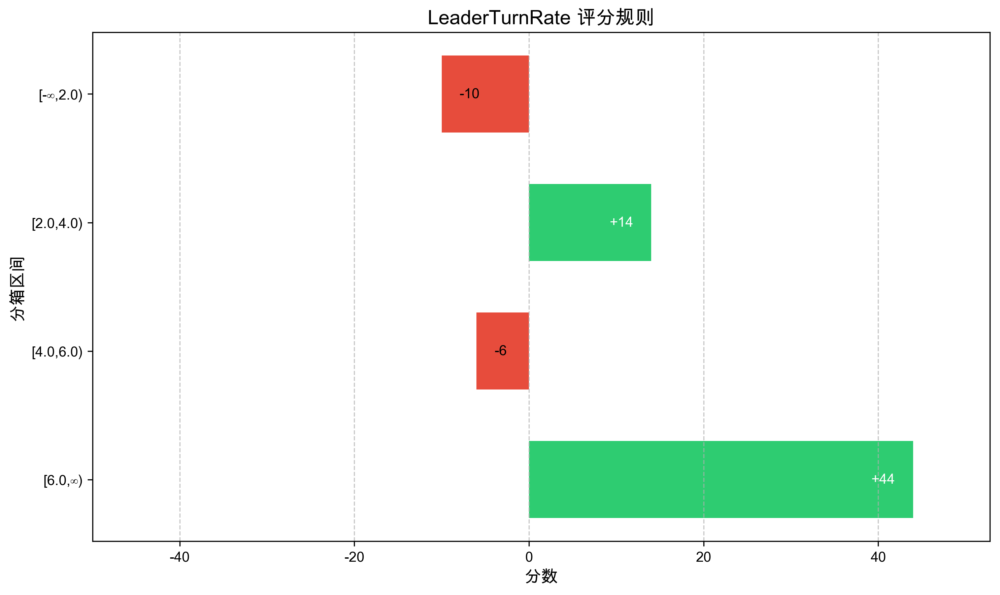

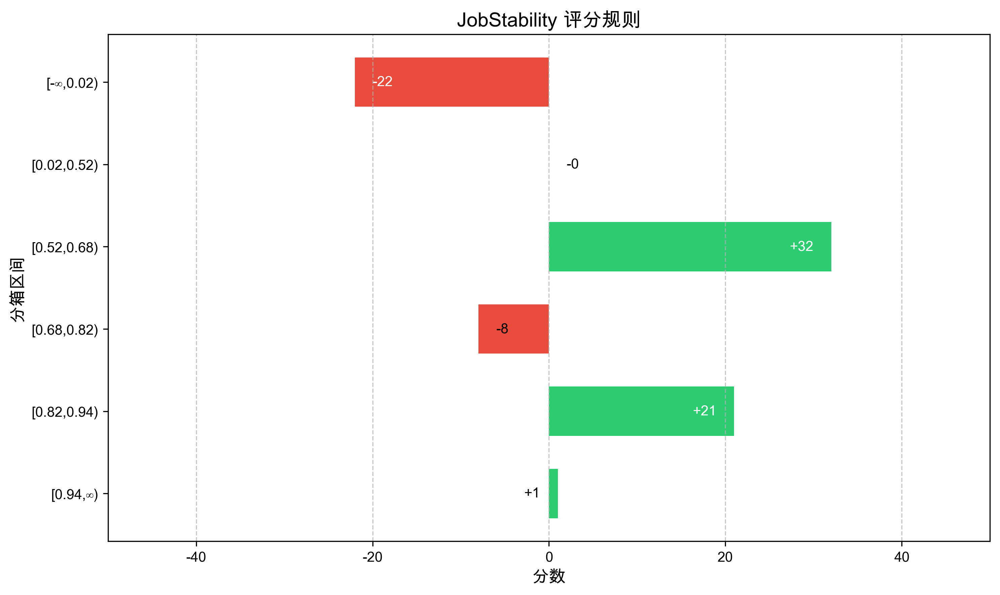

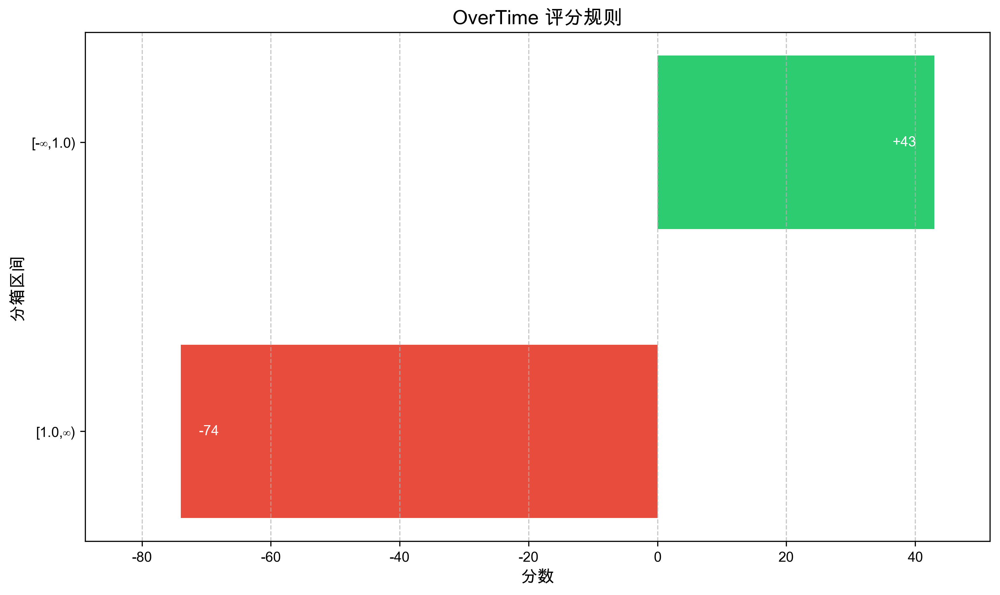

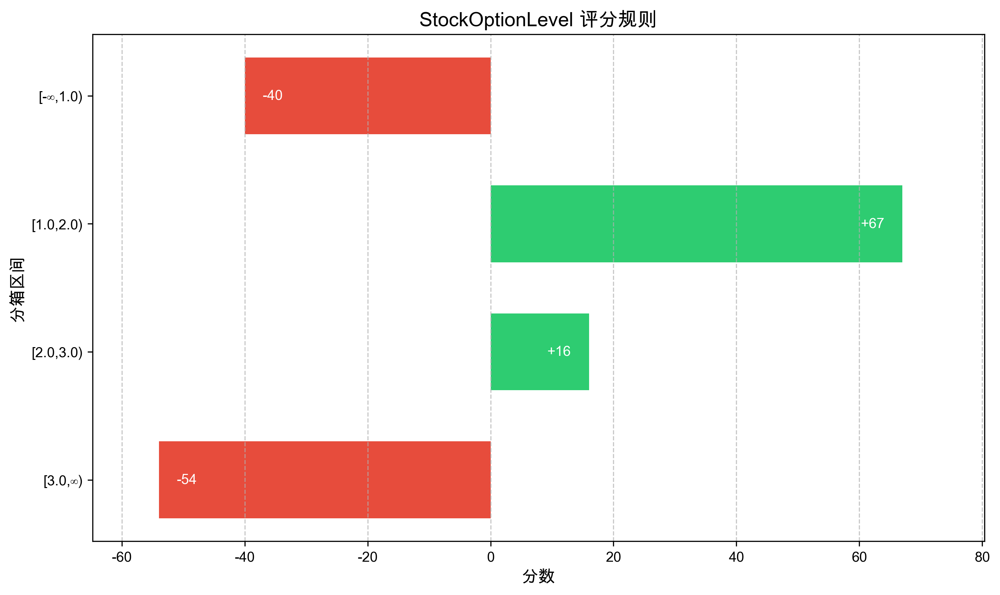

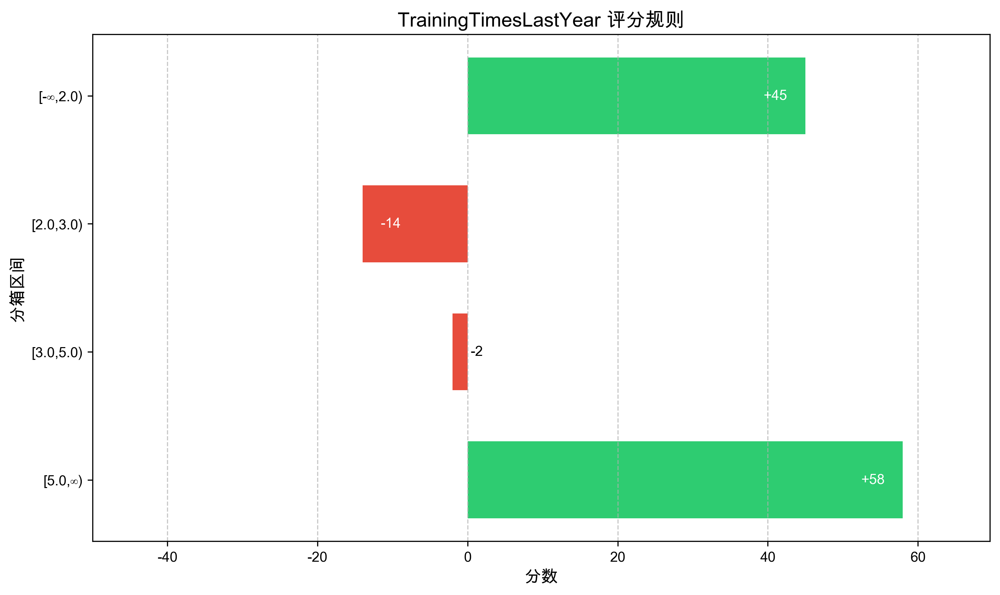

In [89]:
print(f"基础分: {card['basepoints']['points'].iloc[0]}")
for var in card:
    if var == 'basepoints':
        continue
    plot_scorecard(card[var], base_score=card['basepoints']['points'].iloc[0])